In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
lukalafaye_planar_graphs_g6_dataset_path = kagglehub.dataset_download('lukalafaye/planar-graphs-g6-dataset')

print(f'Data source import complete: {lukalafaye_planar_graphs_g6_dataset_path}')


Data source import complete: /kaggle/input/planar-graphs-g6-dataset


In [ ]:
!nvidia-smi

Mon Aug  4 19:54:28 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   60C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

This notebook provides an implementation for the paper EFFICIENT AND SCALABLE GRAPH GENERATION THROUGH ITERATIVE LOCAL EXPANSION: [https://arxiv.org/pdf/2312.11529](https://arxiv.org/pdf/2312.11529)

In [ ]:
# On CPU run instead:
# !pip install torch torchvision torchaudio
# !pip3 install -q torch_geometric
# !pip3 install -q diffusers

In [ ]:
!pip install -q torch==2.4.0+cu124 torchvision torchaudio \
             --index-url https://download.pytorch.org/whl/cu124
!pip install -q pyg_lib torch_scatter torch_sparse \
                torch_cluster torch_spline_conv \
                -f https://data.pyg.org/whl/torch-2.4.0+cu124.html

!pip3 install -q torch_geometric
!pip3 install -q diffusers
# opt dependencies take a while to install pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.4.0+cu124.html

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 797.3/797.3 MB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.7/24.7 MB 89.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.4/883.4 kB 55.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.0/363.0 MB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.4/128.4 MB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.2/176.2 MB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip show torch_scatter | grep Version

Version: 2.1.2+pt24cu124


# Import required librairies

In [ ]:
import numpy as np
import math
from pprint import pprint

import torch
from torch.nn import Dropout, LayerNorm, Linear, Module, ModuleList, Sequential, ReLU
from torch.utils.data import IterableDataset, Dataset
from torch.utils.data import DataLoader as torchDataLoader
import torch.nn.functional as F

from torch_scatter import scatter_add

import torch_geometric
from torch_geometric.utils import get_laplacian
from torch_geometric.data import Data, Batch, DataLoader, InMemoryDataset, download_url
from torch_geometric.utils import erdos_renyi_graph, to_dense_adj, dense_to_sparse, to_networkx, from_networkx
from torch_geometric.nn import GCNConv, GINConv, GATConv, TransformerConv, MessagePassing, GraphNorm

import networkx as nx
import matplotlib.pyplot as plt
import os
import contextlib
import sys

from diffusers import DDPMScheduler
from diffusers.models.embeddings import Timesteps

from tqdm import tqdm
from tqdm.auto import trange

from google.colab import drive
import numpy as np
import seaborn as sns
import pandas as pd
from scipy.stats import binom

In [ ]:
# DO NOT RUN ON CPU


# test gpu usage because pytorch geometric can silently fall back to operations running on cpu
# instead of gpu if some packages are not properly installed

print("Torch  :", torch.__version__, torch.version.cuda)
print("PyG    :", torch_geometric.__version__)
print("CUDA?  :", torch.cuda.is_available())

# 50 k nodes, 200 k edges – big enough to light up the T4
N, E = 50000, 200000
x = torch.randn(N, 16, device='cuda')
edge_index = torch.randint(0, N, (2, E), dtype=torch.long, device='cuda')

conv = GATConv(16, 32, heads=4).cuda()

torch.cuda.reset_peak_memory_stats()
out = conv(x, edge_index)          # forward
torch.cuda.synchronize()

print("Output device:", out.device)
print("Peak GPU RAM :", torch.cuda.max_memory_allocated()/1e6, "MB")


Torch  : 2.4.0+cu124 12.4
PyG    : 2.6.1
CUDA?  : True
Output device: cuda:0
Peak GPU RAM : 343.727104 MB


In [ ]:
print("torch_geometric version:", torch_geometric.__version__)
print("torch version:", torch.__version__)

torch_geometric version: 2.6.1
torch version: 2.4.0+cu124


# Creating datasets for training

## Erdos renyi dataset

In [ ]:
def generate_erdos_renyi_graphData(num_nodes=10, p=0.5):
    edge_tensor = erdos_renyi_graph(num_nodes, p, directed=False)  # shape [2, num_edges]

    # Create graph nodes, values all 0
    nodes = torch.zeros((num_nodes, 1)) # shap4 [num_nodes, 1], any node feature is a single scalar 0.
    # each node in this tensor is assigned an id based on its index 0...num_nodes-1
    # these ids are the ones used in edge_tensor, it is possible that there are no edges...

    # Create Data object for graph
    graphData = Data(x=nodes, edge_index=edge_tensor)

    return graphData

graphDataset = generate_erdos_renyi_graphData()
# G = to_networkx(graph, to_undirected=True)
# plt.figure()
# nx.draw(G, with_labels=True, node_size=500)
# plt.show()

In [ ]:
# inspiration from https://pytorch-geometric.readthedocs.io/en/latest/tutorial/create_dataset.html#creating-in-memory-datasets

class ErdosRenyiDataset(InMemoryDataset):
    def __init__(self, root, num_graphs=100, transform=None, pre_transform=None, pre_filter=None):
        self.num_graphs = num_graphs

        super().__init__(root, transform, pre_transform, pre_filter)

        # Generate dataset if not done already, else load it
        processed_path = self.processed_paths[0]
        if not os.path.exists(processed_path):
            print("Creating dataset")
            self.process()
        else:
            print("Dataset already exists, loading it...")

        self.load(self.processed_paths[0]) # populates self.data
        print("Done.")

        """
        self.load will create objects:

        self.slices = {
          'x':          tensor([0, 2, 5, 6]),   # node feature offsets
          'edge_index': tensor([0, 1, 3, 4]),   # edge index offsets
        }

        self.data = {
          'x':          (total_num_nodes, num_node_features) # concatenation of all graphs nodes
          'edge_index': (2, total_num_edges) # concatenation of all graph edges
        }
        """

    @property
    def processed_file_names(self):
        return ['data.pt']

    def process(self):
        data_list = []

        for i in range(self.num_graphs):
            data_list.append(generate_erdos_renyi_graphData())

        if self.pre_filter:
            data_list = [d for d in data_list if self.pre_filter(d)]

        if self.pre_transform:
            data_list = [self.pre_transform(d) for d in data_list]

        self.save(data_list, self.processed_paths[0]) # Runs: data, slices = cls.collate(data_list) and saves these objects

In [ ]:
!rm -rf /kaggle/working/data/ER/processed
erdos_renyi_dataset = ErdosRenyiDataset(root='data/ER', num_graphs=10000)

Processing...


Dataset already exists, loading it...
Done.


Done!


In [ ]:
print(f"Number of graphs: {len(erdos_renyi_dataset)}")

for g in range(4):
    edge_index = erdos_renyi_dataset[g].edge_index

Number of graphs: 10000


In [ ]:
edge_index[:, :1]

## Planar graph dataset (generated with plantri)

-c3 means graphs that remain connected after removal of any two vertices
containing 12 vertices in total.

Command             | Triangulations Written | CPU Time (sec)
--------------------|------------------------|---------------
./plantri -c3 10    | 233                    | 0.00
./plantri -c3 11    | 1,249                  | 0.02
./plantri -c3 12    | 7,595                  | 0.04
./plantri -c3 13    | 49,566                 | 0.16
./plantri -c3 14    | 339,722                | 1.11
./plantri -c3 15    | 2,406,841              | 8.01
./plantri -c3 16    | 17,490,241             | 61.98
./plantri -c3 17    | 129,664,753            | 504.53

In [ ]:
def graph6_to_data(g6_path):
    print(f"Loading graphs from {g6_path}")

    with open(g6_path, "rb") as f:
        graph_nx = nx.read_graph6(f)

    print(f"Read {len(graph_nx)} graphs from {g6_path}")
    return graph_nx

In [ ]:
# inspiration from https://pytorch-geometric.readthedocs.io/en/latest/tutorial/create_dataset.html#creating-in-memory-datasets

class PlanarDataset(InMemoryDataset):
    def __init__(self, root, g6_dir=None, transform=None, pre_transform=None, pre_filter=None):

        g6_files = [os.path.join(g6_dir, f) for f in os.listdir(g6_dir) if f.endswith("12.g6")]
        self.g6_files = g6_files

        super().__init__(root, transform, pre_transform, pre_filter)

        # Generate dataset if not done already, else load it
        processed_path = self.processed_paths[0]
        if not os.path.exists(processed_path):
            print("Creating dataset")
            self.process()
        else:
            print("Dataset already exists, loading it...")

        self.load(self.processed_paths[0]) # populates self.data
        print("Done.")

        """
        self.load will create objects:

        self.slices = {
          'x':          tensor([0, 2, 5, 6]),   # node feature offsets
          'edge_index': tensor([0, 1, 3, 4]),   # edge index offsets
        }

        self.data = {
          'x':          (total_num_nodes, num_node_features) # concatenation of all graphs nodes
          'edge_index': (2, total_num_edges) # concatenation of all graph edges
        }
        """

    @property
    def processed_file_names(self):
        return ['data.pt']

    def process(self):
        data_list = []

        for file in self.g6_files:
            nx_graphs = graph6_to_data(file)
            data_list += [from_networkx(g) for g in nx_graphs]

        if self.pre_filter:
            data_list = [d for d in data_list if self.pre_filter(d)]

        if self.pre_transform:
            data_list = [self.pre_transform(d) for d in data_list]

        self.save(data_list, self.processed_paths[0]) # Runs: data, slices = cls.collate(data_list) and saves these objects

In [ ]:
planar_dataset = PlanarDataset(root='data/PL', g6_dir=lukalafaye_planar_graphs_g6_dataset_path)

Processing...


Loading graphs from /kaggle/input/planar-graphs-g6-dataset/planar_c3_12.g6
Read 7595 graphs from /kaggle/input/planar-graphs-g6-dataset/planar_c3_12.g6
Dataset already exists, loading it...
Done.


Done!


# Coarsening sampling

We need to sample coarsening sequences from $\Pi_F(G)$ that only use contraction sets in $F(G) = \mathcal{E}$, meaning each coarsening step only merges some edges of the graph.

We sample in $\Pi_F(G)$ by sampling coarsening sequences from a "latent" distribution $q(\pi | G)$. To sample from $q(\pi | G)$, we associate a cost to each possible coarsening set at all coarsening steps, for now the uniform cost.

The below function extracts all possible coarsening sets at a given step (given a graph).

tensor([[0, 2],
        [0, 4],
        [0, 5],
        [0, 6],
        [0, 7],
        [0, 8],
        [0, 9],
        [1, 3],
        [1, 4],
        [1, 5]])
Total number of nodes: 10


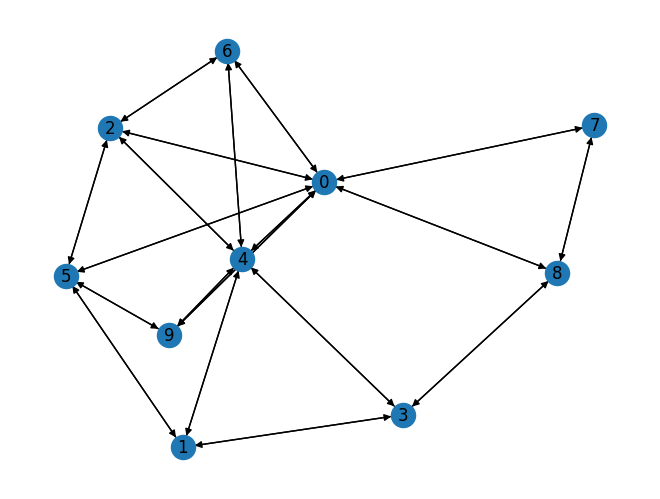

In [ ]:
def get_candidate_contraction_sets(G: Data):
    # make sure no self loop on nodes here!
    edge_index = G.edge_index # 2, num_edges (tensor)
    u, v       = edge_index[0], edge_index[1]

    # remove self edges
    nonself = (u != v)
    u_ns, v_ns = u[nonself], v[nonself]

    candidates = torch.stack([u_ns, v_ns], dim=1)
    return candidates

# test
test_graph = erdos_renyi_dataset[10]
nx.draw(to_networkx(test_graph), with_labels=True)

test_candidates = get_candidate_contraction_sets(test_graph)
print(test_candidates[:10])

test_current_num_nodes = test_graph.num_nodes
print("Total number of nodes:", test_current_num_nodes)

The below function creates a dense adjency matrix given a graph by looking at all of its edges.

In [ ]:
def get_graph_adj(edge_index: torch.LongTensor, num_nodes: int):
    adj = to_dense_adj(edge_index, max_num_nodes=num_nodes)
    adj = adj[0]
    return adj

# test
test_graph_adj = get_graph_adj(test_graph.edge_index, test_graph.num_nodes)
#indices = (graph_adj == 1).nonzero(as_tuple=False)
print(test_graph_adj)

tensor([[0., 0., 1., 0., 1., 1., 1., 1., 1., 1.],
        [0., 0., 0., 1., 1., 1., 0., 0., 0., 0.],
        [1., 0., 0., 0., 1., 1., 1., 0., 0., 0.],
        [0., 1., 0., 0., 1., 0., 0., 0., 1., 0.],
        [1., 1., 1., 1., 0., 0., 1., 0., 0., 1.],
        [1., 1., 1., 0., 0., 0., 0., 0., 0., 1.],
        [1., 0., 1., 0., 1., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
        [1., 0., 0., 1., 0., 0., 0., 1., 0., 0.],
        [1., 0., 0., 0., 1., 1., 0., 0., 0., 0.]])


<span style="color:red">The uniform cost should be replaced by  local-variation cost of Loukas (2018) from the paper otherwise model won't train well!</span>

In [ ]:
def get_uniform_cost(candidate_contractions: torch.LongTensor, graphData: Data): # can also be based on G0, P1...P{l-1}
    # graphData not used, just used for compatibility
    num_candidates = candidate_contractions.shape[0]

    return torch.tensor([np.random.rand() for _ in range(num_candidates)], dtype=torch.float32)

# test
get_uniform_cost(test_candidates, test_graph)

tensor([0.3285, 0.3648, 0.4935, 0.0251, 0.1347, 0.7827, 0.5664, 0.1980, 0.5920,
        0.0646, 0.8954, 0.5128, 0.3995, 0.8881, 0.8562, 0.9094, 0.7781, 0.5326,
        0.2382, 0.8066, 0.3690, 0.4155, 0.2486, 0.6213, 0.7627, 0.0779, 0.4605,
        0.3897, 0.6123, 0.9567, 0.8218, 0.7938, 0.5486, 0.2899, 0.6503, 0.3635,
        0.5157, 0.4088])

Better cost function inspired from the paper. Try to conserve structure. The idea is that after computing eigenvectors of the laplacian, in each vector, the difference between coordinates i (first node) and j (second node) is either high or low. If low, this means the two nodes diffuse signals similarly? if high, they shouldnt be removed. We compute the sum of squared differences and   

In [ ]:
def get_improved_cost(
    candidate_contractions: torch.LongTensor,   # [E', 2]  candidate contractions
    graphData: Data,
    k:int = 8,
) -> torch.Tensor:                  # → [E']  cost per edge
    """
    Cheap surrogate of Loukas' local-variation cost.
    Computes ‖A[u]-A[v]‖₂ for every candidate edge (u,v).
    """
    edge_index = graphData.edge_index
    num_nodes = graphData.num_nodes

    adj = get_graph_adj(edge_index, num_nodes)
    deg = adj.sum(1)
    L   = torch.diag(deg) - adj

    # First-k eigenvectors
    evals, evecs = torch.linalg.eigh(L)
    F = evecs[:, :min(k, num_nodes-1)] # [N, k]

    u, v = candidate_contractions.t() # [2, E'] -> [E'] and [E']
    diffs = F[u] - F[v] # [E',k] - [E',k]

    cost  = (diffs**2).sum(dim=1) #[E']

    return cost

# test
get_improved_cost(test_candidates, test_graph)

tensor([0.7095, 0.2759, 0.8347, 0.8390, 0.8924, 0.8149, 0.7502, 1.9957, 0.8887,
        1.7845, 0.7095, 0.6924, 1.7162, 1.9714, 1.9957, 1.0161, 1.9315, 0.2759,
        0.8887, 0.6924, 1.0161, 1.0491, 0.7836, 0.8347, 1.7845, 1.7162, 1.7578,
        0.8390, 1.9714, 1.0491, 0.8924, 1.9973, 0.8149, 1.9315, 1.9973, 0.7502,
        0.7836, 1.7578])

Below is the implementation of the rnd_greedy_min_cost_part algorithm 2 from the paper. Basically this algorithm runs at each step, and given number of nodes to remove, iteratively selectes the best contraction set (edges in our case) to use for coarsening, until the number of nodes to remove is obtained.

In [ ]:
def rnd_greedy_min_cost_part(
    candidate_contractions: torch.LongTensor,
    cost_function,
    current_graph, # added this parameter to compute cost, it contains current_graph on which coarsening is done
    num_nodes_to_remove: int,
    current_num_nodes: int,
    rand_lambda: float = 1.0,
):
    """
    Algo 2
    candidate_contractions [num_candidates, 2] each candidate is a pair of nodes (edge)
    Greedily picks contraction candidates until at least num_nodes_to_remove are merged.
    """

    num_candidates = candidate_contractions.size(0)
    alive = torch.ones(num_candidates, dtype=torch.bool) # check for already selected contractions, True means not selected
    marked  = torch.zeros(current_num_nodes, dtype=torch.bool) # mark nodes already contracted...

    costs  = cost_function(candidate_contractions, current_graph)

    # each cost is a rand float between 0 and 1

    picked = [] # picked contractions idx
    removed = 0

    #print(f"inside rnd_greedy_min_cost_part: i need to remove {num_nodes_to_remove} nodes")
    while (removed < num_nodes_to_remove and alive.any()):
        masked_costs = costs.masked_fill(~alive, float('inf'))
        idx = torch.argmin(masked_costs).item()

        if torch.rand(1).item() > rand_lambda: # simulate Bernoulli, after selecting an edge to remove, sample a Bernoulli and while it is not 0 never select it again and continue process
            alive[idx] = False
            continue

        selected_nodes = candidate_contractions[idx] # this contains the selected edge (pair of nodes) to remove

        if marked[selected_nodes].any(): # maybe one of the two selected nodes is already used in some other edge that needs to be removed, then never select edge again and continue process
            alive[idx] = False
            continue

        # otherwise mark it as selected set both of the nods to unalive and continue

        marked[selected_nodes] = True
        alive[idx] = False
        picked.append(idx)
        #print(f"We find a new edge to remove: {candidate_contractions[idx]}, removing it will remove: {selected_nodes.numel() - 1} nodes.")
        removed +=  selected_nodes.numel() - 1 # merging always keeps one node
        #print(f"inside rnd_greedy_min_cost_part: fo far i removed {removed} nodes.")

    #print(f"I might have stopped because alive.any(): {alive.any()}")
    if picked:
        picked_idx = torch.tensor(picked, dtype=torch.long)
        return candidate_contractions[picked_idx]
    else:
        print("rnd_greedy_min_cost_part Error")

# test
# for remove_n in range(1, current_num_nodes // 2): # max number of removable nodes
#     test_partitioning = rnd_greedy_min_cost_part(test_candidates, get_cost, remove_n, current_num_nodes)
#     print(f"Removed {remove_n} nodes with contractions: {test_partitioning}")

test_num_nodes_to_remove = 2
# uniform cost also possible with  get_uniform_cost instead of get_improved_cost
test_partitioning = rnd_greedy_min_cost_part(test_candidates, get_improved_cost, test_graph, test_num_nodes_to_remove, test_current_num_nodes)
print(test_partitioning)

tensor([[0, 4],
        [2, 5]])


Below is a visualization function that assigns a unique color to each cluster id (as long as there are less than 34 clusters in total), and then displays the graph by coloring clusters (all nodes in a given cluster will share that cluster color).

In [ ]:
def visualize_clusters(G: Data, partitioning: torch.Tensor):
    # Convert to NetworkX
    if getattr(G, 'edge_attr', None) is not None:
        G_nx = to_networkx(G, to_undirected=True, edge_attrs=["edge_attr"])
        raw_attrs = {
            (u, v): int(d["edge_attr"])
            for u, v, d in G_nx.edges(data=True)
        }
    else:
        G_nx = to_networkx(G, to_undirected=True)
        raw_attrs = {}

    # Create a color map for each node
    color_map = ['lightgray'] * G.num_nodes  # default color

    # Assign a unique color for each cluster
    colors = [
        'red', 'green', 'blue', 'orange', 'purple', 'cyan', 'yellow', 'brown',
        'pink', 'olive', 'chocolate', 'lime', 'navy', 'teal', 'coral', 'gold',
        'magenta', 'orchid', 'salmon', 'darkgreen', 'deepskyblue', 'slateblue',
        'violet', 'maroon', 'turquoise', 'indigo', 'darkorange', 'crimson',
        'steelblue', 'darkviolet', 'khaki', 'cadetblue', 'hotpink', 'mediumseagreen'
    ]

    cluster_id_to_color = {}

    for cluster_id, cluster in enumerate(partitioning):
        color = colors[cluster_id % len(colors)]
        cluster_id_to_color[cluster_id] = color
        for node in cluster.tolist():
            color_map[node] = color
        print(f"Cluster {cluster_id} has color {colors[cluster_id % len(colors)]}")

    edge_colors = []
    for u, v in G_nx.edges():
        a = raw_attrs.get((u, v), None)
        edge_colors.append('red' if a == -1 else 'black')

    # Draw the graph
    pos = nx.spring_layout(G_nx, seed=42)
    nx.draw(G_nx, pos, node_color=color_map, with_labels=True, edge_color=edge_colors)
    plt.show()

    return cluster_id_to_color

Cluster 0 has color red
Cluster 1 has color green


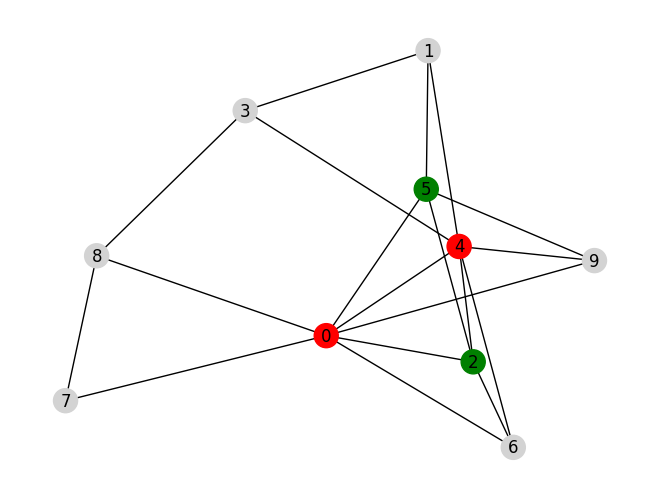

Cluster 0 has color red


In [ ]:
test_cluster_id_to_color = visualize_clusters(test_graph, test_partitioning)
print(f"Cluster 0 has color {test_cluster_id_to_color[0]}")

In [ ]:
def has_edge_undirected(edge_index, u, v):
    src, dst = edge_index
    return ((src == u) & (dst == v)).any() or ((src == v) & (dst == u)).any()

has_edge_undirected(test_graph.edge_index, 3, 5)

tensor(False)

The below function completes a partitioning tensor containing all coarsening sets (pairs of nodes forming an edge that need to be merged) with the remaining sets that will not be merged for future code compatibility. The remaining sets not to be merged will all contain leftover nodes stacked with themselves, and concatenated at the end of the partitioning tensor. For instance one left over node i will be concatenated as [i, i].

In [ ]:
def augment_with_singletons(partitioning: torch.LongTensor, num_nodes: int, debug=False):
    """
    Given partitioning of shape [P,2]
    return a new LongTensor of shape [P+U, K'] where rows 0..P-1
    are your old clusters, and rows P..P+U-1 each contain exactly
    one leftover node as a single cluster.
    """
    # flatten and find which nodes were clustered
    clustered = partitioning.unique() # no dim specified -> unique of the flattened partitioning
    num_initial_clusters = partitioning.shape[0]

    all_nodes = torch.arange(num_nodes, device=partitioning.device)

    mask = torch.ones(num_nodes, dtype=torch.bool, device=partitioning.device)
    mask[clustered] = False

    leftover = all_nodes[mask]  # shape [U]

    # now make each leftover its own cluster of size 1, with itself, little trick
    singletons = torch.stack([leftover, leftover], dim=1) # [U, 2]

    if singletons.numel() > 0:
        partitioning = torch.cat([partitioning, singletons], dim=0)

        if debug:
            for i, node_id in enumerate(leftover.tolist()):
                cluster_id = num_initial_clusters + i
                print(f"Leftover node {node_id} assigned to singleton cluster {cluster_id}")

    return partitioning # ideally also explain what id each solo cluster got for coloring later!

# test
print(f"Number of clusters before: {test_partitioning.shape[0]}")
test_augmented_partitioning = augment_with_singletons(test_partitioning, test_current_num_nodes, debug=True)
print(f"Number of clusters after: {test_augmented_partitioning.shape[0]}")

Number of clusters before: 2
Leftover node 1 assigned to singleton cluster 2
Leftover node 3 assigned to singleton cluster 3
Leftover node 6 assigned to singleton cluster 4
Leftover node 7 assigned to singleton cluster 5
Leftover node 8 assigned to singleton cluster 6
Leftover node 9 assigned to singleton cluster 7
Number of clusters after: 8


The below function builds a matrix P mapping all nodes to their clusters (left over nodes are considered as single node clusters) returns [num_clusters, N] for N nodes.

In [ ]:
def build_P(num_nodes: int,
            partitioning: torch.Tensor):
    """
    num_nodes: N
    partitioning: list of LongTensors, each contains original node‑indices cluster (max 2 nodes per cluster since we only consider edges).
    Returns P of shape [num_clusters, N], where P[c,i]=1 if i belongs to coarse‑node c.
    """
    num_clusters = len(partitioning)

    P = torch.zeros((num_clusters, num_nodes), dtype=torch.float32)
    for c, nodes in enumerate(partitioning):
        P[c, nodes] = 1.0
    return P

# test
test_P = build_P(test_current_num_nodes, test_augmented_partitioning)
print(test_P)

tensor([[1., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 1., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]])


Each row corresponds to one cluster id, each column corresponds to one node. This can be reused to compute the expansion step GT as each cluster super node will need to be expanded back to however many nodes it contains.

The below function creates an adjency matrix for clusters. Two clusters which initially contained nodes connected to each other will end up connected. Self loops for one cluster are removed by filling the diagonal of this matrix with 0s.

In [ ]:
def get_cluster_adj(P: torch.FloatTensor,
                        A: torch.FloatTensor):
    # P: [C, N]; A: [N, N]
    M = P @ A @ P.t()       # [C, C], computes inter cluster links, if any two clusters initially had nodes connected they will be connected
    M.fill_diagonal_(0)
    return (M > 0).to(torch.float32)

# test
test_cluster_adj = get_cluster_adj(test_P, test_graph_adj)
print(test_cluster_adj)

tensor([[0., 1., 1., 1., 1., 1., 1., 1.],
        [1., 0., 1., 0., 1., 0., 0., 1.],
        [1., 1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 1., 0.],
        [1., 1., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 1., 0.],
        [1., 0., 0., 1., 0., 1., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0., 0.]])


The below function coarsens a graph given a partitioning containing coarsening sets (a set can be a cluster containing two nodes to merge, or a left over node copied twice that shouldn't be merged). It uses previous functions to returned the coarsened graph as well as the node-cluster mapping matrix that was used to build it.

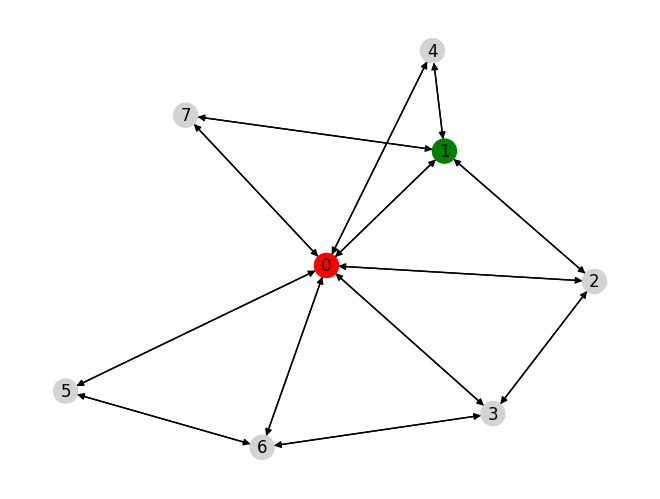

In [ ]:
def coarsen_graph(G: Data, partitioning: torch.LongTensor):
    """
    Merge each row of partitioning into a single super‐node.
    Unclustered nodes are nodes j not appearing in any row of partitioning.
    Edges between any two super‐nodes exist iff any member nodes in both were previously connected in G.
    G{l}->G{l+1}
    """

    N = G.num_nodes

    augmented_partitioning = augment_with_singletons(partitioning, N)

    P = build_P(N, augmented_partitioning) # map nodes to clusters
    graph_adj = get_graph_adj(G.edge_index, N) # get initial graph adjency
    cluster_adj = get_cluster_adj(P, graph_adj) # get clusters adjency

    edge_index, edge_attr = dense_to_sparse(cluster_adj) # convert cluster adj to list of edges
    num_clusters = cluster_adj.size(0)

    x = torch.zeros((num_clusters, 1), dtype=torch.float32) # creates a list of cluster nodes
    return Data(x=x, edge_index=edge_index, num_nodes=num_clusters), P # returns a new graph using list of cluster nodes and how they should be connected + the node-cluster mapping matrix

# test
test_coarsened_graph, test_P = coarsen_graph(test_graph, test_partitioning)

def get_coarse_node_colors(num_clusters: int, cluster_id_to_color: dict) -> list[str]:
    """
    Returns a list of colors for super-nodes in the coarsened graph.
    Each super-node corresponds to a cluster ID.
    """
    color_map = []
    for cluster_id in range(num_clusters):
        color = cluster_id_to_color.get(cluster_id, 'lightgray')
        color_map.append(color)
    return color_map

test_num_clusters = test_coarsened_graph.num_nodes
test_coarse_colors = get_coarse_node_colors(test_num_clusters, test_cluster_id_to_color)

# Step 3: Plot the coarsened graph
nx.draw(to_networkx(test_coarsened_graph), with_labels=True, node_color=test_coarse_colors)

A sequence of coarsening steps will always reach a single node graph eventually since the starting graph is fully connected and the only way to reach one node is to merge a graph containing two nodes (one edge).

In [ ]:
curr = 1
for i in range(10):
    print(curr)
    curr = curr-math.ceil(0.10*curr) # math.ceil(0.10*curr) represents the number of nodes to remove, it is computed in the algorithm that follows.

1
0
0
0
0
0
0
0
0
0


The below function implements rnd_red_seq (algorithm 1) from the paper. It takes as input the initial graph and returns the list of coarsened graphs at each step up to the final single node graph, as well as the contractions history (the node-cluster mappings for building each intermediate coarsened graph).

In [ ]:
def rnd_red_seq(G0: Data, min_red_frac=0.1, max_red_frac=0.3, debug=False): # it is not possible to remove more than current_num_nods//2 with edge contraction
    """
    Algo 1
    Returns random coarsening sequence π = (G0, . . . , GL) ∈ ΠF (G)
    """

    current_graph = G0

    if debug: print(f"Initial graph has {G0.num_nodes} nodes.")
    coarsening_seq = [current_graph] # π, will end up containing (G0...GL)
    l = 0

    contractions_history = [] # will contain (P1...PL-1) where Pi is the partitioning matrix used to coarsen Gi into G{i+1}

    while current_graph.num_nodes != 1: # removing % of current_num_nods to current_num_nods will always be bigger than 0 and math.ceil
        # will end up being one until current_num_nods becomes 1 -> last node will be removed
        l += 1
        reduction_fraction = torch.tensor([1.0])
        reduction_fraction.uniform_(min_red_frac, max_red_frac)  # ρ

        # f already defined as get_cost, for now does not depend on G0/contractions_history
        num_nodes_to_remove = math.ceil(reduction_fraction * current_graph.num_nodes) # m

        candidates = get_candidate_contraction_sets(current_graph) # F(G{l−1}) fetch all possible contractions
        if candidates.numel() == 0:
            print("Error no more edges to contract in rnd_red_seq")
            break

        partitioning_l = rnd_greedy_min_cost_part(
            candidate_contractions=candidates,
            cost_function=get_improved_cost,
            current_graph=current_graph,
            num_nodes_to_remove=num_nodes_to_remove,
            current_num_nodes=current_graph.num_nodes
        ) # tensor [C0, C1, …, Ck] # [num_clusters, 2]

        if partitioning_l.numel() == 0:
            print("No contractions picked")
            continue

        # coarsen graph
        if debug: print(f"Coarsening graph and trying to remove {num_nodes_to_remove} nodes.") # sometimes in some shapes such as S3 (star 4 nodes, one central) we cannot remove two nods
            # if we pick the center one...
        current_graph, P = coarsen_graph(current_graph, partitioning_l)
        if debug: print(f"Coarsened graph has {current_graph.num_nodes} nodes.")

        coarsening_seq.append(current_graph)
        contractions_history.append(P)

    return coarsening_seq, contractions_history

# test
test_coarsening_seq, test_contractions_history = rnd_red_seq(test_graph, debug=True)
print(len(test_coarsening_seq), len(test_contractions_history))

print("\nCoarsening sequence:")
pprint(test_coarsening_seq)

print("\nContractions history:")
pprint(test_contractions_history)

Initial graph has 10 nodes.
Coarsening graph and trying to remove 3 nodes.
Coarsened graph has 7 nodes.
Coarsening graph and trying to remove 3 nodes.
Coarsened graph has 5 nodes.
Coarsening graph and trying to remove 2 nodes.
Coarsened graph has 4 nodes.
Coarsening graph and trying to remove 1 nodes.
Coarsened graph has 3 nodes.
Coarsening graph and trying to remove 1 nodes.
Coarsened graph has 2 nodes.
Coarsening graph and trying to remove 1 nodes.
Coarsened graph has 1 nodes.
7 6

Coarsening sequence:
[Data(x=[10, 1], edge_index=[2, 38]),
 Data(x=[7, 1], edge_index=[2, 22], num_nodes=7),
 Data(x=[5, 1], edge_index=[2, 12], num_nodes=5),
 Data(x=[4, 1], edge_index=[2, 6], num_nodes=4),
 Data(x=[3, 1], edge_index=[2, 4], num_nodes=3),
 Data(x=[2, 1], edge_index=[2, 2], num_nodes=2),
 Data(x=[1, 1], edge_index=[2, 0], num_nodes=1)]

Contractions history:
[tensor([[1., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0.,

# Retrieving data needed for expansion

In [ ]:
for g in erdos_renyi_dataset[0:5]:
    print(g)

Data(x=[10, 1], edge_index=[2, 44])
Data(x=[10, 1], edge_index=[2, 36])
Data(x=[10, 1], edge_index=[2, 38])
Data(x=[10, 1], edge_index=[2, 52])
Data(x=[10, 1], edge_index=[2, 54])


The below function computes the cluster counts (v) given a node/cluster mapping matrix. Since we only use clusters of 1/2 nodes -> we reformulate the problem as classification between -1 if node shouldn't be expanded (cluster size 1) , 1 if node should be expanded (cluster size 2)

In [ ]:
def compute_node_embeddings(P):
    # Gl is coarsened into Glp1 using Pl
    # Pl is given as input
    # output is the expansion vector v used to come back to Gl from Glp1
    # so it should have as many nodes as coarsened graph Gl!
    cluster_counts = P.sum(dim=1).long() # v_l
    #assign = P.argmax(dim=0)
    #v = cluster_counts[assign]
    v = cluster_counts-2
    return v

# test
print("P:")
print(test_P.shape)

test_v = compute_node_embeddings(test_P)
print("Result:\n", test_v.shape)

P:
torch.Size([8, 10])
Result:
 torch.Size([8])


The below function expands a coarsened graph based on the node/cluster mapping matrix that was used to obtain that coarsened graph Gc, it returns the adjency matrix of the expanded graph.

In [ ]:
def expand_coarsened(Gc: Data, P):
    """
    Takes Gc coarsened graph as input and
    P the node-cluster mapping matrix used to obtain Gc
    """
    device = P.device

    C, N = P.shape

    coarsened_adj = get_graph_adj(Gc.edge_index, Gc.num_nodes) # [C, C]

    # for each node i find its cluster id
    clusters = P.argmax(dim=0)  # [N]  each in 0..C-1

    # # intercluster connections
    # for i in range(N):
    #     for j in range(N):
    #         if clusters[i] != clusters[j]:
    #             ci, cj = clusters[i], clusters[j]
    #             if coarsened_adj[ci, cj] == 1:
    #                 expanded_adj[i, j] = 1
    #                 expanded_adj[j, i] = 1
    #         else:
    #             expanded_adj[i, j] = 1
    #             expanded_adj[j, i] = 1

    # np.fill_diagonal(expanded_adj, 0)
    # return expanded_adj

    # chatgpt optimized version using broadcasting
    idx_i = clusters.unsqueeze(1)  # [N,1]
    idx_j = clusters.unsqueeze(0)  # [1,N]

    # intercluster mask
    inter_mask = coarsened_adj[idx_i, idx_j].to(torch.int) # [N, N]

    # intracluster mask
    intra_mask = idx_i == idx_j.to(torch.int) # [N, N]

    # combine and zero out diagonal no self loop
    expanded = (inter_mask | intra_mask).to(device)
    expanded.fill_diagonal_(False)

    return expanded

# test
test_expanded_graph_adj = expand_coarsened(test_coarsened_graph, test_P)
print(test_expanded_graph_adj)
print(test_P.shape)
print(test_coarsened_graph.num_nodes)
print(test_expanded_graph_adj.shape)

tensor([[0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
        [1, 0, 1, 1, 1, 1, 0, 0, 0, 0],
        [1, 1, 0, 0, 1, 1, 1, 0, 0, 1],
        [1, 1, 0, 0, 1, 0, 0, 0, 1, 0],
        [1, 1, 1, 1, 0, 1, 1, 1, 1, 1],
        [1, 1, 1, 0, 1, 0, 1, 0, 0, 1],
        [1, 0, 1, 0, 1, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 1, 0, 0, 0, 1, 0],
        [1, 0, 0, 1, 1, 0, 0, 1, 0, 0],
        [1, 0, 1, 0, 1, 1, 0, 0, 0, 0]], dtype=torch.int32)
torch.Size([8, 10])
8
torch.Size([10, 10])


<span style="color:red">Should we realy remove self loops here? expanded.fill_diagonal_(False) in the paper diagram for PPGN self loops are kept eventhough the model should learn to remove them of course...</span>

Below is the original test graph that we coarsen using the colored clusters.

Original clustering
Cluster 0 has color red
Cluster 1 has color green


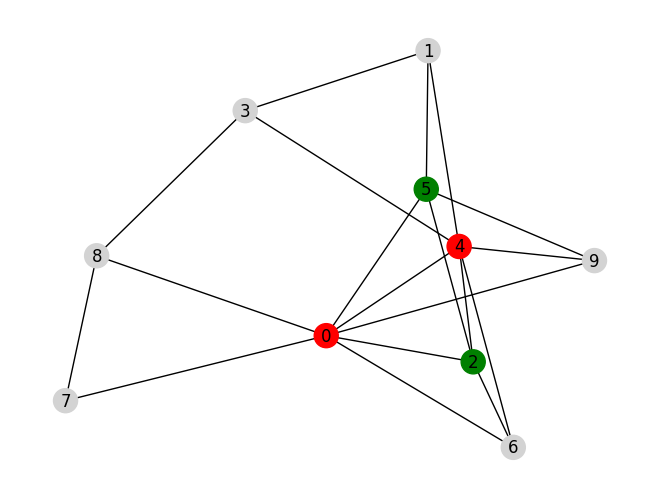

In [ ]:
print("Original clustering")
test_cluster_id_to_color = visualize_clusters(test_graph, test_partitioning)

In [ ]:
test_cluster_id_to_color

{0: 'red', 1: 'green'}

Below is the coarsened graph obtained from the previous clusters + original graph.

Original coarsened graph


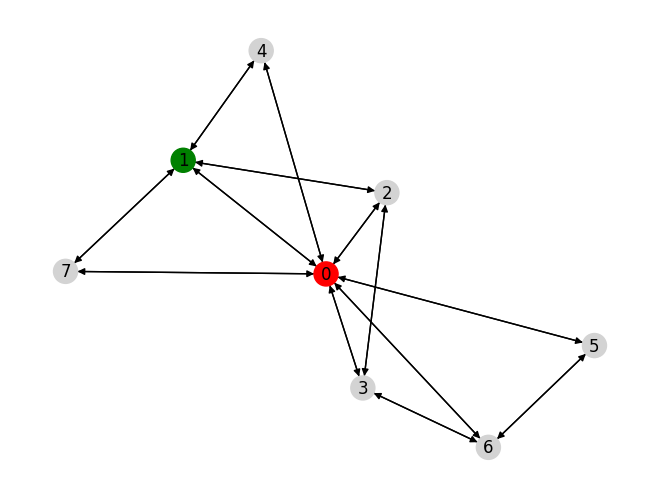

In [ ]:
print("Original coarsened graph")
nx.draw(to_networkx(test_coarsened_graph), with_labels=True, node_color=test_coarse_colors)

Below is a function which given the adjency matrix of some expanded graph $\tilde{G}_l$  creates the refined graph Data object $G_l$.  $\tilde{G}_l$ was obtained after expanding some $\tilde{G}_{l+1}$ using $v_{l+1}$. The new graph should contain the same edges as the expanded graph, but with labels indicating whether we should keep (1) or remove/refine them (-1). All edges can be represented as $e_l$. Node embeddings will then contain for each node the future expansion counts required, all node embeddings can therefore be represented as $v_l$ later on.

In [ ]:
def refine_expanded_graph(expanded_adj: torch.Tensor, original_adj: torch.Tensor, v: torch.Tensor) -> Data:
    """
    expanded_adj: [N, N] dense adjacency (0/1)
    expanded_adj: [N, N] dense adjacency (0/1)
    v are the expansion counts for all nodes in graph Gl tilde, used to obtain Glm1

    returns: Data(x=[N,1], edge_index=[2, E])
    """
    edge_index, edge_attr = dense_to_sparse(expanded_adj)

    edge_labels = original_adj[edge_index[0],edge_index[1]].long() # [E], 1 if exists in original 0 otherwise
    edge_labels = edge_labels * 2 - 1 # remap 0/1 to -1/1, -1 means should be removed...

    #x = torch.zeros((expanded_adj.size(0), 1), dtype=torch.float)
    x = torch.zeros((expanded_adj.size(0), 1), dtype=torch.float)
    y = v.float()

    return Data(x=x, edge_index=edge_index, edge_attr=edge_labels, y=y)

test_refinedGraphData = refine_expanded_graph(test_expanded_graph_adj, test_graph_adj, test_v)
print(test_refinedGraphData.num_nodes)
print(".x:", test_refinedGraphData.x.shape)
print(".y:", test_refinedGraphData.y.shape)
print("edge_attr:", test_refinedGraphData.edge_attr)

10
.x: torch.Size([10, 1])
.y: torch.Size([8])
edge_attr: tensor([-1,  1, -1,  1,  1,  1,  1,  1,  1, -1, -1,  1,  1,  1,  1, -1,  1,  1,
         1, -1, -1,  1,  1,  1,  1,  1,  1,  1, -1,  1, -1, -1,  1,  1,  1,  1,
        -1, -1,  1,  1,  1,  1, -1,  1, -1,  1,  1,  1, -1,  1,  1, -1,  1,  1])


Expanded and refined (red) graph coarsened graph
Cluster 0 has color red
Cluster 1 has color green


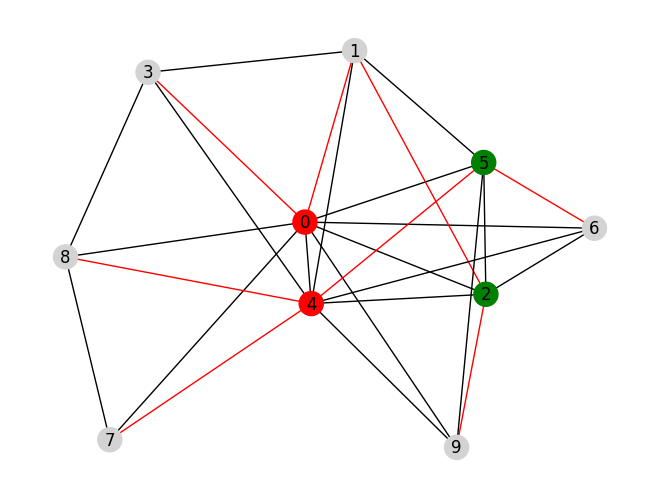

In [ ]:
print("Expanded and refined (red) graph coarsened graph")
test_cluster_id_to_color = visualize_clusters(test_refinedGraphData, test_partitioning)

We can extract from the refined graph the vector $e_l$ and for each edge print its -1/1 value.

In [ ]:
edge_index = test_refinedGraphData.edge_index   # shape [2, E]
edge_attr  = test_refinedGraphData.edge_attr    # shape [E] or [E,1]

for i in range(edge_index.size(1)):
    u = edge_index[0, i].item()
    v = edge_index[1, i].item()
    a = edge_attr[i].item() if edge_attr.ndim == 1 else edge_attr[i,0].item()
    print(f"Edge ({u:2d}, {v:2d})  → attr = {a}")

Edge ( 0,  1)  → attr = -1
Edge ( 0,  2)  → attr = 1
Edge ( 0,  3)  → attr = -1
Edge ( 0,  4)  → attr = 1
Edge ( 0,  5)  → attr = 1
Edge ( 0,  6)  → attr = 1
Edge ( 0,  7)  → attr = 1
Edge ( 0,  8)  → attr = 1
Edge ( 0,  9)  → attr = 1
Edge ( 1,  0)  → attr = -1
Edge ( 1,  2)  → attr = -1
Edge ( 1,  3)  → attr = 1
Edge ( 1,  4)  → attr = 1
Edge ( 1,  5)  → attr = 1
Edge ( 2,  0)  → attr = 1
Edge ( 2,  1)  → attr = -1
Edge ( 2,  4)  → attr = 1
Edge ( 2,  5)  → attr = 1
Edge ( 2,  6)  → attr = 1
Edge ( 2,  9)  → attr = -1
Edge ( 3,  0)  → attr = -1
Edge ( 3,  1)  → attr = 1
Edge ( 3,  4)  → attr = 1
Edge ( 3,  8)  → attr = 1
Edge ( 4,  0)  → attr = 1
Edge ( 4,  1)  → attr = 1
Edge ( 4,  2)  → attr = 1
Edge ( 4,  3)  → attr = 1
Edge ( 4,  5)  → attr = -1
Edge ( 4,  6)  → attr = 1
Edge ( 4,  7)  → attr = -1
Edge ( 4,  8)  → attr = -1
Edge ( 4,  9)  → attr = 1
Edge ( 5,  0)  → attr = 1
Edge ( 5,  1)  → attr = 1
Edge ( 5,  2)  → attr = 1
Edge ( 5,  4)  → attr = -1
Edge ( 5,  6)  → attr = -1


# Creating SignNet node embeddings from graph for conditional diffusion

This code is adapted from their implementation.

In [ ]:
class MLP(Module):
    """This block implements the multi-layer perceptron (MLP) module.

    Args:
        in_features (int): Number of features of the input.
        hidden_features (list[int]): List of the hidden features dimensions.
        out_features (int, optional): If not `None` a projection layer is added at the end of the MLP. Defaults to `None`.
        bias (bool, optional): Whether to use bias in the linear layers. Defaults to `True`.
        norm_layer (Module, optional): Normalization layer to use. Defaults to `norm_layer`.
    """

    def __init__(
        self,
        in_features: int,
        hidden_features: list[int],
        out_features: int | None = None,
        bias: bool = True,
        norm_layer=LayerNorm,
    ):
        super().__init__()
        lin_layers = []
        norm_layers = []
        hidden_in_features = in_features
        for hidden_dim in hidden_features:
            lin_layers.append(Linear(hidden_in_features, hidden_dim, bias=bias))
            norm_layers.append(norm_layer(hidden_dim))
            hidden_in_features = hidden_dim

        self.out_layer = (
            Linear(hidden_in_features, out_features, bias=bias)
            if out_features is not None
            else None
        )

        self.lin_layers = ModuleList(lin_layers)
        self.norm_layers = ModuleList(norm_layers)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        for lin, norm in zip(self.lin_layers, self.norm_layers):
            x = lin(x)
            x = norm(x)
            x = torch.relu(x)

        if self.out_layer is not None:
            x = self.out_layer(x)

        return x

In [ ]:
class SignNet(Module):
    def __init__(
        self,
        num_eigenvectors: int,
        hidden_features: int,
        out_features: int,
        num_layers: int,
        dropout: float = 0.0,
    ) -> None:
        super().__init__()

        self.in_layer = Linear(2, hidden_features)
        self.conv_layers = ModuleList(
            [
                GINConv(
                    MLP(hidden_features, [hidden_features, hidden_features]),
                    train_eps=True,
                )
                for _ in range(num_layers)
            ]
        )
        self.skip_layer = Linear(hidden_features * (num_layers + 1), hidden_features)
        self.dropout = Dropout(dropout)
        # the following corresponds to the ρ function in the paper
        self.merge_layer = MLP(
            in_features=num_eigenvectors * hidden_features,
            hidden_features=[hidden_features, hidden_features],
            out_features=out_features,
        )

    def forward(self, spectral_features, edge_index):
        """Forward pass of the model.

        Args:
            spectral_features (Tensor): Eigenvalues (repeated) concatenated with eigenvectors. Shape: :math:`(V, num_eigenvectors * 2)`.
            edge_index (Adj): Adjacency matrix given as edge index or sparse tensor. Shape: :math:`(2, E)` or :math:`(V, V)`.

        Returns:
            Tensor: Node features. Shape: :math:`(V, out_features)`.
        """
        # Stack spectral features
        eigenvalues_repeated, eigenvectors = spectral_features.chunk(
            2, dim=-1
        )  # (V, k), (V, k)

        positive_spectral_features = torch.stack(
            [eigenvalues_repeated, eigenvectors], dim=-1
        )  # V, k, 2
        negative_spectral_features = torch.stack(
            [eigenvalues_repeated, -eigenvectors], dim=-1
        )  # V, k, 2
        combined_spectral_features = torch.stack(
            [positive_spectral_features, negative_spectral_features]
        ).transpose(
            1, 2
        )  # 2, k, V, 2

        # Apply layers
        x = self.in_layer(combined_spectral_features)  # 2, k, V, hidden_features
        xs = [x]
        for conv in self.conv_layers:
            # apply conv layer to each spectral feature independently
            x = conv(x=x, edge_index=edge_index)
            xs.append(x)

        # Skip connection
        x = torch.cat(xs, dim=-1)
        x = self.dropout(x)
        x = self.skip_layer(x)  # 2, k, V, hidden_features
        # Make sign invariant
        x = x.sum(dim=0)  # k, V, hidden_features

        # Merge features
        x = x.transpose(0, 1)  # V, k, hidden_features
        x = self.merge_layer(x.reshape(x.size(0), -1))  # V, out_features

        return x

In [ ]:
# define model
global_k = 8 # means the model takes as input 2x 32 = 64, we select first 32 eigenval/eigenvectors for all graphs
# and pad with 0s if needed, one node i will get [lambda 1, ..., lambda num_nodes-1, 0 ,..., u1(i), ..., un-1(i), 0, ..., 0]

# model input should be (V,2k) where k eigenvectors were selected, since some graphs might have less nodes than global_k we pad them with 0s...
# ideally with a big k we always have k>V and for each node the input vector will be 2k with first k values : [lambda 1, ..., lambda V, 0...0,     eigevec_0, ...., eigevec_V, 0...0]

# basically for each node,
embedding_model = SignNet(
    num_eigenvectors=global_k,
    hidden_features=64,
    out_features=128,
    num_layers=3,
    dropout=0.1
)

In [ ]:
def get_spectral_features_torch(data, k=global_k):
    N = data.num_nodes

    if N==1: return torch.randn((1, 2 * k), device=data.x.device)

    # Get Laplacian
    lap_edge_index, lap_edge_weight = get_laplacian(data.edge_index, num_nodes=N, normalization='sym') # computes laplacian and returns as edge_index with weights on each edge (pair of nodes)

    L_dense = to_dense_adj(lap_edge_index, edge_attr=lap_edge_weight, max_num_nodes=N).squeeze(0) # convert to matrix form
    # max_num_nodes guarantees the dense matrix is N×N even when some rows/columns are completely zero.

    # Compute eigendecomposition
    eigvals, eigvecs = torch.linalg.eigh(L_dense)  # eigenvalues sorted in ascending order, computes all 50 + their corresponding eigen vectors
    # shapes [num_nodes] and [num_nodes, num_nodes] resp. one column = one eigen vector

    # Take k smallest eigen values and corresponding vectors
    eigvals = eigvals[1:k+1] # [k,] (remove the 0 eigen value) / [num_nodes-1,] if num_nodes-1<k...
    eigvals = eigvals.unsqueeze(0) #[1,k]
    eigvals = eigvals.repeat(data.num_nodes, 1) # num_nodes, k / num_nodes, num_nodes-1  if num_nodes-1<k...

    eigvecs = eigvecs[:, 1:k+1] # [num_nodes, k] remove eigen vector linked with 0 eigen value /  [num_nodes, num_nodes-1] if num_nodes-1<k

    num_nodes = eigvecs.shape[0]
    num_vecs = eigvecs.shape[1] # could be num_nodes-1 and not k if  num_nodes-1<k

    if num_vecs<k:
        # prepare padding matrix for both eigen values and eigen vectors
        diff = k-num_vecs
        pad_vals = torch.zeros((N, diff), device=eigvals.device)
        pad_vecs = torch.zeros((N, diff), device=eigvals.device)

        eigvals = torch.cat([eigvals, pad_vals], dim=1) # num_nodes, k
        eigvecs = torch.cat([eigvecs, pad_vecs], dim=1) # num_nodes, k

    try:
        return torch.cat([eigvals, eigvecs], dim=1) # (N, 2k)
    except RuntimeError as err:
        print("\n!!! spectral cat() failed !!!")
        print("graph id        :", data)
        print("data.num_nodes  :", data.num_nodes)
        print("eigvals shape   :", eigvals.shape)
        print("eigvecs shape   :", eigvecs.shape)
        print("full traceback follows\n")
        raise

# test
get_spectral_features_torch(test_graph, 100).shape

torch.Size([10, 200])

In [ ]:
spectral_features = get_spectral_features_torch(test_graph, k=global_k)
print(spectral_features.shape)

embedding_model.eval()
with torch.no_grad():
    out = embedding_model(spectral_features, test_graph.edge_index)

print(out.shape) # for each node outputs some 128 dimensional embedding

torch.Size([10, 16])
torch.Size([10, 128])


The below function is O(n3)! Can be optimized using scipy.sparse.linalg.eigsh.

In [ ]:
def fill_H_embeddings(G_expanded: Data, G_coarsened: Data, Plp1, embedding_model, rand=False):
    """
    Basically calculates embedding from Glp1 graph using embedding_model Signnet and algo5 from paper, then replicates these embeddings inside G_expanded
    all nodes belonging to a coarsened cluster will get that cluster embedding...
    Plp1 is the cluster/node mapping for transition Gl->Glp1

    G_expanded is the graph that needs to be filled!
    """

    num_nodes = G_coarsened.num_nodes
    if rand:
        #H = torch.randn(num_nodes)
        x = torch.randn((G_expanded.num_nodes, 128), G_expanded.x.device)
        G_expanded.x = x
        return G_expanded

    else:
        dev = next(embedding_model.parameters()).device

        spectral_feats = get_spectral_features_torch(G_coarsened, k=global_k).to(dev)
        edge_idx_dev   = G_coarsened.edge_index.to(dev)

        with torch.no_grad():
            H_coarsened = embedding_model(spectral_feats, edge_idx_dev)

        # broadcast using P_l that was used to obtain G_coarsened from G
        cluster_id = Plp1.argmax(dim=0).to(dev)
        H_expanded = H_coarsened[cluster_id] # Basically all nodes i in some cluster j with embedding Hj, will end up with embedding Hj
        G_expanded.x = H_expanded.to(G_expanded.x.device) # set node embeddings

        return G_expanded

# test
test_graph = fill_H_embeddings(test_graph, test_coarsened_graph, test_P, embedding_model)
print(test_graph)

Data(x=[10, 128], edge_index=[2, 38])


# Creating the training dataset

The diffusion model will learn to denoise e_l (refine current graph), and v_l future expansions after refinement to get Gl-1, given the following parameters most contained in refined graph Gl:

* noised el and vl obtained from Gl˜ (noised T times using ddpm scheduler) (from refined graph which edges attr contain -1/1, and .y contains -1/1 for each potential node expansion)
* T
* Gl˜ node embeddings containing info obtained using coarsened Glp1 (.x inside refined graph)

In [ ]:
# class CoarsenDataset(IterableDataset): # torch dataset
#     def __init__(self, graphsDataset, embedding_model, min_red=0.1, max_red=0.3, start=0, end=None, debug=False):
#         super(CoarsenDataset).__init__()
#         self.min_red = min_red
#         self.max_red = max_red

#         self.graphsDataset = graphsDataset
#         self.embedding_model = embedding_model
#         self.start = start
#         self.end = len(graphsDataset) if end is None else end
#         self.debug = debug

#     def __iter__(self):
#         iter_start = self.start
#         iter_end = self.end
#         graphsDataset = self.graphsDataset
#         debug = self.debug

#         selected_graphs = graphsDataset[iter_start: iter_end]

#         for G0 in selected_graphs:
#             coarsening_seq, contractions_history = rnd_red_seq(G0, self.min_red, self.max_red)

#             if debug: print("coarsening_seq, contractions_history", len(coarsening_seq), len(contractions_history))
#             # coarsening_seq = [G0, G1, ..., G_L]
#             # contractions_history = [P1, P2, ..., P_{L}]  where P_l is used for G_{l-1}->G_l
#             # P_l are the node-cluster mappings...

#             num_initial_nodes = G0.num_nodes # target num nodes

#             original_adj = get_graph_adj(G0.edge_index, G0.num_nodes)

#             # to construct each sample we need:
#             # from a sequence G{l-1} ---(Pl)---> Gl ----(Plp1)---> Glp1

#             # first expand Glp1 using Plp1 -> and obtain Gl˜ before refinement
#             # compare Gl˜ and Gl to get refined graph and extract e_l -> add that to graph Gl˜ to obtain refined graph with proper edge attributes which is denoted as Gl
#             # Use Pl to compute next node expansion for Gl (the expansion that will lead to G{l-1}˜)

#             # for last node we know v=[2]
#             # then given refined graphs + node embeddings/edgeattributes resp. G1,G2....,G{l-1} we can learn to create resp. G0, ..., Gl-2
#             # we don't need to learn how to create Gl-1 since given any single node graph GL we just duplicate it into two nodes and that gives Gl-1...
#             # therefore we can reconstruct any sequence backwards if model learns to reproduce the refinement+future expansion steps...

#             for i in range(1, len(contractions_history)-1): # 1, ..., L-2
#                 Glm1 = coarsening_seq[i-1] # G0, G1, ..., Gl-3
#                 Gl = coarsening_seq[i] #  G1, G2, ..., Gl-2
#                 Glp1 = coarsening_seq[i+1] # G2, G3, ..., Gl-1
#                 Pl = contractions_history[i-1] # used to coarsen Glm1 into Gl,    P1...Pl-2
#                 Plp1 = contractions_history[i] # used to coarsen Gl into Glp1,   P2, ..., Pl-1

#                 original_graph_adj_Gl = get_graph_adj(Gl.edge_index, Gl.num_nodes) # original Gl adjency matrix
#                 expanded_graph_adj_Gl_tilde = expand_coarsened(Glp1, Plp1) # Gl tilde, using actual cluster values, #G1...Gl-2 tilde
#                 # we expand using Plp1 (that is vlp1 expansion counts for all nodes)

#                 if debug: print("Gl.num_nodes", Gl.num_nodes)

#                 #vlp1 = compute_node_embeddings(Plp1) # extract cluster sizes -1/1 if need to expand, of Glp1
#                 v_parent = compute_node_embeddings(Pl) # future node expansions of Gl tilde, used to obtain Glm1
#                 if debug: print("v_parent.shape: ", v_parent.shape)

#                 refined_graph = refine_expanded_graph(expanded_graph_adj_Gl_tilde, original_graph_adj_Gl, v_parent) # Gl refined version ,  G1, G2, ..., Gl-2
#                 if debug: print("refined_graph.num_nodes: ", refined_graph.num_nodes)

#                 # data object, is refined G_l containing e_l edge attr 1 keep /-1 remove; future vl expansion labels on each node in .y, missing node embeddings obtained from Glp1 and replicated
#                 # across all cluster nodes
#                 refined_graph = fill_H_embeddings(refined_graph, Glp1, Plp1, embedding_model) # adds all node embeddings inside Gl refined graph according to algo 5, using its later coarsened version Glp1
#                 # as well as Plp1 transition and the embedding model

#                 pho = (Glm1.num_nodes - Gl.num_nodes) / Gl.num_nodes # proportion of nodes that were removed
#                 # from Glm1 to obtain Gl

#                 yield refined_graph, num_initial_nodes, pho

In [ ]:
class CoarsenDataset(Dataset): # torch dataset
    def __init__(self, graphsDataset, embedding_model, min_red=0.1, max_red=0.3, debug=False):
        super().__init__()

        self.min_red = min_red
        self.max_red = max_red
        self.graphsDataset = graphsDataset
        self.embedding_model = embedding_model
        self.debug = debug

        self.samples = []

        for G0 in graphsDataset:
            coarsening_seq, contractions_history = rnd_red_seq(G0, self.min_red, self.max_red)

            if debug: print("coarsening_seq, contractions_history", len(coarsening_seq), len(contractions_history))
            # coarsening_seq = [G0, G1, ..., G_L]
            # contractions_history = [P1, P2, ..., P_{L}]  where P_l is used for G_{l-1}->G_l
            # P_l are the node-cluster mappings...

            num_initial_nodes = G0.num_nodes # target num nodes

            original_adj = get_graph_adj(G0.edge_index, G0.num_nodes)

            # to construct each sample we need:
            # from a sequence G{l-1} ---(Pl)---> Gl ----(Plp1)---> Glp1

            # first expand Glp1 using Plp1 -> and obtain Gl˜ before refinement
            # compare Gl˜ and Gl to get refined graph and extract e_l -> add that to graph Gl˜ to obtain refined graph with proper edge attributes which is denoted as Gl
            # Use Pl to compute next node expansion for Gl (the expansion that will lead to G{l-1}˜)

            # for last node we know v=[2]
            # then given refined graphs + node embeddings/edgeattributes resp. G1,G2....,G{l-1} we can learn to create resp. G0, ..., Gl-2
            # we don't need to learn how to create Gl-1 since given any single node graph GL we just duplicate it into two nodes and that gives Gl-1...
            # therefore we can reconstruct any sequence backwards if model learns to reproduce the refinement+future expansion steps...

            for i in range(1, len(contractions_history)-1): # 1, ..., L-2
                Glm1 = coarsening_seq[i-1] # G0, G1, ..., Gl-3
                Gl = coarsening_seq[i] #  G1, G2, ..., Gl-2
                Glp1 = coarsening_seq[i+1] # G2, G3, ..., Gl-1
                Pl = contractions_history[i-1] # used to coarsen Glm1 into Gl,    P1...Pl-2
                Plp1 = contractions_history[i] # used to coarsen Gl into Glp1,   P2, ..., Pl-1

                original_graph_adj_Gl = get_graph_adj(Gl.edge_index, Gl.num_nodes) # original Gl adjency matrix
                expanded_graph_adj_Gl_tilde = expand_coarsened(Glp1, Plp1) # Gl tilde, using actual cluster values, #G1...Gl-2 tilde
                # we expand using Plp1 (that is vlp1 expansion counts for all nodes)

                if debug: print("Gl.num_nodes", Gl.num_nodes)

                #vlp1 = compute_node_embeddings(Plp1) # extract cluster sizes -1/1 if need to expand, of Glp1
                v_parent = compute_node_embeddings(Pl) # future node expansions of Gl tilde, used to obtain Glm1
                if debug: print("v_parent.shape: ", v_parent.shape)

                refined_graph = refine_expanded_graph(expanded_graph_adj_Gl_tilde, original_graph_adj_Gl, v_parent) # Gl refined version ,  G1, G2, ..., Gl-2
                if debug: print("refined_graph.num_nodes: ", refined_graph.num_nodes)

                # data object, is refined G_l containing e_l edge attr 1 keep /-1 remove; future vl expansion labels on each node in .y, missing node embeddings obtained from Glp1 and replicated
                # across all cluster nodes
                refined_graph = fill_H_embeddings(refined_graph, Glp1, Plp1, embedding_model) # adds all node embeddings inside Gl refined graph according to algo 5, using its later coarsened version Glp1
                # as well as Plp1 transition and the embedding model

                pho = (Glm1.num_nodes - Gl.num_nodes) / Gl.num_nodes # proportion of nodes that were removed
                # from Glm1 to obtain Gl

                self.samples.append((refined_graph, num_initial_nodes, pho))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        return self.samples[idx]

In [ ]:
def coarsen_collate(samples):
    """
    samples: list of tuples (refined_graph, init_num_nodes, level_l)
    returns batch_graph PyG Batch object with all graphs merged;
    init_N      : LongTensor [B]  –  original |V(G0)| for all graphs in batch
    pho_l     : LongTensor [B]  –  coarsening prop. % of nodes removed to obtain current graph
    """
    graphs, init_nodes, levels = zip(*samples)

    batch_graph = Batch.from_data_list(graphs)  # automatic concat
    init_N = torch.tensor(init_nodes, dtype=torch.long)
    pho_l = torch.tensor(levels, dtype=torch.long)

    return batch_graph, init_N, pho_l

In [ ]:
# dataset = CoarsenDataset(graphsDataset=erdos_renyi_dataset,embedding_model=embedding_model)

# loader = DataLoader(
#     dataset,
#     batch_size=32,
#     shuffle=True,             # now supported
#     collate_fn=coarsen_collate,
#     num_workers=4,
# )

Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more edges to contract in rnd_red_seq
Error no more

In [ ]:
dataset = CoarsenDataset(graphsDataset=planar_dataset,embedding_model=embedding_model)

loader = DataLoader(
    dataset,
    batch_size=32,
    shuffle=True,             # now supported
    collate_fn=coarsen_collate,
    num_workers=4,
)

/usr/local/lib/python3.11/dist-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
for batch_graph, init_N, pho_l in loader:
    print("batch_graph: ", batch_graph)
    print("init_N: ", init_N)
    print("pho_l ", pho_l)
    break

graphs = batch_graph.to_data_list()

print("\nNum nodes in each graph of batch:")
for g in graphs:
    print(g.num_nodes, g.y.shape)

batch_graph:  DataBatch(x=[164, 128], edge_index=[2, 600], edge_attr=[600], y=[164], batch=[164], ptr=[33])
init_N:  tensor([12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
        12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12])
pho_l  tensor([0.6000, 0.5000, 0.5000, 0.4000, 0.3333, 0.2000, 0.3333, 0.5000, 0.7500,
        0.2500, 0.2000, 0.3333, 0.3333, 0.3333, 0.2857, 0.4000, 0.5000, 0.2500,
        0.5000, 0.2500, 0.5000, 0.5000, 0.2500, 0.3333, 0.6667, 0.3333, 0.2500,
        0.2500, 0.2500, 0.3333, 0.2000, 0.2000])

Num nodes in each graph of batch:
5 torch.Size([5])
4 torch.Size([4])
8 torch.Size([8])
5 torch.Size([5])
9 torch.Size([9])
5 torch.Size([5])
3 torch.Size([3])
6 torch.Size([6])
4 torch.Size([4])
4 torch.Size([4])
10 torch.Size([10])
3 torch.Size([3])
6 torch.Size([6])
3 torch.Size([3])
7 torch.Size([7])
5 torch.Size([5])
6 torch.Size([6])
4 torch.Size([4])
4 torch.Size([4])
4 torch.Size([4])
4 torch.Size([4])
4 torch.Size([4])
4 torch.S

In [ ]:
print(batch_graph.x.shape)
print(batch_graph.y.shape)
print(batch_graph.edge_index.shape)

torch.Size([164, 128])
torch.Size([164])
torch.Size([2, 600])


# Defining denoising model

In [ ]:
class SimpleDenoiser(Module):
    """
    input:
        data.x  H_node dim 128 for each embedding
        data.y : v_noisy, stored on all graph nodes as labels -1/1
        data.edge_attr: e_noisy edge targets stored on edge features
        t_node, t_edge: diffusion timesteps for all nodes and edges
        init_N, pho_l, target size of G0 and reduction pho

    output:
        node_eps: predicted noise in v_noisy
        edge_eps: predicted noise in e_noisy
    """

    def __init__(self, in_dim, hid_dim=64, t_emb_dim=16, dropout_p=0.1):
        super().__init__()

        # embeddings for diffusion timestep t, initial graph size target, pho reduction factor
        self.t_embed = Timesteps(
            num_channels=t_emb_dim,
            flip_sin_to_cos=False,
            downscale_freq_shift=1,
            scale=1,
        ) # map timestep to sinusoidal vector of length

        self.scalar_ml = Linear(2, t_emb_dim)

        node_in = in_dim + 1 + 2*t_emb_dim # H_node | v_noisy | t | scalars

        self.gcn1 = GCNConv(node_in,  hid_dim)
        self.norm1 = GraphNorm(hid_dim)

        self.gcn2 = GCNConv(hid_dim,  hid_dim)
        self.norm2 = GraphNorm(hid_dim)

        self.gcn3 = GCNConv(hid_dim,  hid_dim)
        self.norm3 = GraphNorm(hid_dim)
        self.dropout = Dropout(dropout_p)

        # prediction heads for node and edge classification
        self.node_head = Sequential(Linear(hid_dim, hid_dim),
                                     ReLU(),
                                     Linear(hid_dim, 1)) # no activation at the end since noise can be both positive/negative...


        # src node embedding | dst node embedding | corresponding e_noisy scalar
        self.edge_head = Sequential(Linear(2*hid_dim + 1, hid_dim),
                                     ReLU(),
                                     Linear(hid_dim, 1)) # no activation at the end since noise can be both positive/negative...

    def forward(self, data, t_node, t_edge, init_N, pho_l):

        # node input
        v_feat  = data.y.unsqueeze(1)

        t_node = t_node.to(torch.long).view(-1)

        t_feat  = self.t_embed(t_node)

        scalars = torch.stack([init_N[data.batch].float(), pho_l[data.batch].float()], dim=1)
        s_feat  = self.scalar_ml(scalars)

        x_in = torch.cat([data.x, v_feat, t_feat, s_feat], dim=1)

        h = torch.relu(self.gcn1(x_in, data.edge_index))
        h = self.norm1(h)
        h = torch.relu(h)

        h = self.gcn2(h, data.edge_index)
        h = self.norm2(h)
        h = torch.relu(h)

        h = self.gcn3(h, data.edge_index)
        h = self.norm3(h)
        h = torch.relu(h)
        h = self.dropout(h)

        # node classification
        node_eps = self.node_head(h).squeeze(-1)

        # edge classification
        src, dst = data.edge_index
        e_feat   = data.edge_attr.unsqueeze(1)
        edge_h   = torch.cat([h[src], h[dst], e_feat], dim=1)

        edge_eps = self.edge_head(edge_h).squeeze(-1)

        return node_eps, edge_eps

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [ ]:
model = SimpleDenoiser(in_dim=batch_graph.x.size(1)).to(device)
opt = torch.optim.Adam(model.parameters(), lr=10e-4)

scheduler = DDPMScheduler(num_train_timesteps=1000, beta_schedule="linear")
scheduler.set_timesteps(1000)

# Training model

In [ ]:
# is model on gpu? do not run on cpu

print("CUDA available:", torch.cuda.is_available())
print("Current CUDA device index:", torch.cuda.current_device()) # this will fail on cpu
print("Current CUDA device name:", torch.cuda.get_device_name(torch.cuda.current_device()))

first_param = next(model.parameters())
print("Model first param is on:", first_param.device)

for name, param in model.named_parameters():
    if not param.is_cuda:
        print(f"Parameter {name} is on CPU!")

CUDA available: True
Current CUDA device index: 0
Current CUDA device name: Tesla T4
Model first param is on: cuda:0


Most of the noise that is added is between -3 and 3 so an average loss below 1 is pretty good.

In [ ]:
T = scheduler.config.num_train_timesteps
all_losses = []
num_epochs = 60

for epoch in range(1, num_epochs+1):
  epoch_losses = []
  for batch_graph, init_N, pho_l in loader:
      batch_graph = batch_graph.to(device, non_blocking=True)
      B = init_N.size(0) # batch size

      t_graph = torch.randint(0, T, (B,) , device=device) # per batch T sampling

      # batch_graph.x.size(0), contains for each graph in batch its num_nodes
      # we sample coordinate-wise (for each node/edge) time levels, each node gets noised using a different ti, which we
      # will of course provide to the model after...

      #t_node = torch.randint(0, T, (batch_graph.x.size(0),),  device=device)
      #t_edge = torch.randint(0, T, (batch_graph.edge_attr.size(0),), device=device)

      t_node = t_graph[batch_graph.batch] # [num_nodes across batch]
      src    = batch_graph.edge_index[0]  # src node of each edge
      t_edge = t_graph[batch_graph.batch[src]]  # [num_edges across batch]

      # expansion v_l and refinement e_l vectors, will be noised soon
      clean_v = batch_graph.y.float() # [num_nodes across batch]
      clean_e = batch_graph.edge_attr.float() # [num_edges across batch]

      # prepare random gaussian noise to add to each node/edge using same sized vectors
      noise_v = torch.randn_like(clean_v)
      noise_e = torch.randn_like(clean_e)

      # add noise using hf ddpm scheduler using all different sampled time steps
      v_noisy = scheduler.add_noise(clean_v.unsqueeze(-1),# [num_nodes across batch, 1]
                                    noise_v.unsqueeze(-1),
                                    t_node).squeeze(-1) # [num_nodes across batch]

      # for e_l refinement vectors too
      e_noisy = scheduler.add_noise(clean_e.unsqueeze(-1), # [num_edges across batch, 1]
                                    noise_e.unsqueeze(-1),
                                    t_edge).squeeze(-1)  # [num_edges across batch]

      # all are on device
      # print("batch_graph.x on:", batch_graph.x.device)
      # print("batch_graph.edge_index on:", batch_graph.edge_index.device)
      # print("batch_graph.edge_attr on:", batch_graph.edge_attr.device)
      # print("v_noisy on:", v_noisy.device)
      # print("e_noisy on:", e_noisy.device)

      data_t = batch_graph.clone()
      data_t.y = v_noisy
      data_t.edge_attr = e_noisy

      # allare on device
      # print("data_t.y on:", data_t.y.device)
      # print("data_t.edge_attr on:", data_t.edge_attr.device)

      # predict noise
      pred_v_eps, pred_e_eps = model(data_t,
                                    t_node, t_edge,
                                    init_N.to(device),
                                    pho_l.to(device))

      # all are on device
      # print("Output pred_v_eps on:", pred_v_eps.device)
      # print("Output pred_e_eps on:", pred_e_eps.device)

      # l2 loss
      loss  = (pred_v_eps - noise_v).pow(2).mean() + \
              (pred_e_eps - noise_e).pow(2).mean()
      epoch_losses.append(loss.item())

      # backprop
      opt.zero_grad()
      loss.backward()
      opt.step()

  avg_loss = sum(epoch_losses) / len(epoch_losses)
  all_losses.append(avg_loss)
  print(f"Epoch {epoch:2d}/{num_epochs} - avg loss: {avg_loss:.4f}")

Epoch  1/60 - avg loss: 1.1207
Epoch  2/60 - avg loss: 0.9455
Epoch  3/60 - avg loss: 0.8105
Epoch  4/60 - avg loss: 0.7653
Epoch  5/60 - avg loss: 0.7394
Epoch  6/60 - avg loss: 0.7199
Epoch  7/60 - avg loss: 0.7116
Epoch  8/60 - avg loss: 0.7022
Epoch  9/60 - avg loss: 0.6940
Epoch 10/60 - avg loss: 0.6921
Epoch 11/60 - avg loss: 0.6983
Epoch 12/60 - avg loss: 0.6819
Epoch 13/60 - avg loss: 0.6882
Epoch 14/60 - avg loss: 0.6853
Epoch 15/60 - avg loss: 0.6833
Epoch 16/60 - avg loss: 0.6832
Epoch 17/60 - avg loss: 0.6761
Epoch 18/60 - avg loss: 0.6764
Epoch 19/60 - avg loss: 0.6745
Epoch 20/60 - avg loss: 0.6734
Epoch 21/60 - avg loss: 0.6745
Epoch 22/60 - avg loss: 0.6711
Epoch 23/60 - avg loss: 0.6714
Epoch 24/60 - avg loss: 0.6681
Epoch 25/60 - avg loss: 0.6693
Epoch 26/60 - avg loss: 0.6669
Epoch 27/60 - avg loss: 0.6645
Epoch 28/60 - avg loss: 0.6642
Epoch 29/60 - avg loss: 0.6630
Epoch 30/60 - avg loss: 0.6640
Epoch 31/60 - avg loss: 0.6630
Epoch 32/60 - avg loss: 0.6639
Epoch 33

In [ ]:
print("CUDA memory allocated (MB):", torch.cuda.memory_allocated() / 1024**2)
print("CUDA memory reserved  (MB):", torch.cuda.memory_reserved()  / 1024**2)

CUDA memory allocated (MB): 19.94677734375
CUDA memory reserved  (MB): 372.0


Plot loss

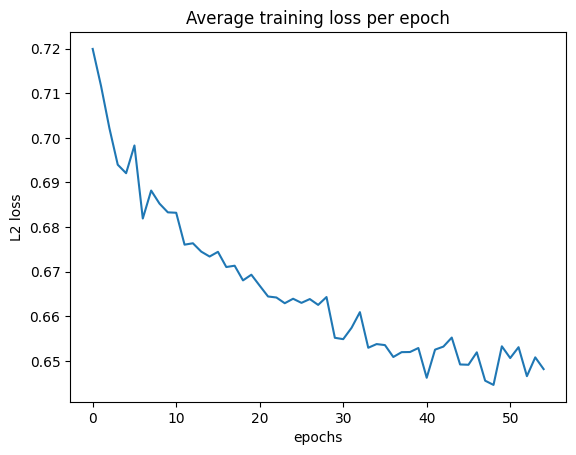

In [ ]:
plt.plot(all_losses[5:])
plt.xlabel("epochs")
plt.ylabel("L2 loss")
plt.title("Average training loss per epoch")
plt.show()

# Generating new graphs

Seed GL graph. Create GLm1 from GL single node graph and initialize its embeddings properly.

In [ ]:
def seed_graph(feat_dim: int = 128) -> Data:
    """Returns GL (one node self edge? expansion true), GL-1 two nodes one edge"""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    edge_index_GL = torch.empty((2, 0), dtype=torch.long)
    GL_graph = Data(x=torch.randn(1), edge_index=edge_index_GL, num_nodes=1) # single node graph, only created to apply fill_H_embeddings
    # PL
    PL = torch.tensor([[1, 1]]) # both nodes of GLm1 belong to same cluster node, the only in GL

    # create GLm1seed_graph
    edge_index = torch.tensor([[0, 1],
                               [1, 0]], dtype=torch.long, device=device)
    x   = torch.zeros((2, feat_dim), device=device)
    # need to pass through embedding func here instead?

    y   = torch.ones(2, device=device) # v_l 1s only keep
    e_a = torch.ones(2, device=device) # e_l one only keep, 2 because undirected edge

    GLm1 = Data(x=x, edge_index=edge_index,
                edge_attr=e_a,  y=y)

    GLm1 = fill_H_embeddings(GLm1, GL_graph, PL, embedding_model)
    return GLm1

# test
test_GLm1 = seed_graph()
print(test_GLm1)

Data(x=[2, 128], edge_index=[2, 2], edge_attr=[2], y=[2])


In [ ]:
test_GLm1.edge_index

tensor([[0, 1],
        [1, 0]], device='cuda:0')

Obtain model predictions on GLm1 for a single denoising step

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

In [ ]:
print(device)
T = scheduler.config.num_train_timesteps

test_init_N = torch.tensor([20], device=device)
test_pho_l = torch.tensor([0.15], device=device) # during generation we will sample pho randomly

# create a batch containing single graph GLm
G_batched  = Batch.from_data_list([test_GLm1]).to(device) #, device=device)
t_graph = torch.randint(0, T, (1,), device=device) # noise number of timesteps

t_node  = t_graph.expand(test_GLm1.num_nodes) # [N]
src     = test_GLm1.edge_index[0]
t_edge  = t_graph.expand(src.size(0)) # [E]


# expansion v_l and refinement e_l vectors, will be noised soon
clean_v = test_GLm1.y.float().to(device) # [num_nodes]
clean_e = test_GLm1.edge_attr.float().to(device) # [num_edges]

# prepare random gaussian noise to add to each node/edge using same sized vectors
noise_v = torch.randn_like(clean_v, device=device)
noise_e = torch.randn_like(clean_e, device=device)

# add noise using hf ddpm scheduler using all different sampled time steps
v_noisy = scheduler.add_noise(clean_v.unsqueeze(-1),  # [num_nodes,1]
                              noise_v.unsqueeze(-1),
                              t_node).squeeze(-1)  # back to [num_nodes]

# for e_l refinement vectors too
e_noisy = scheduler.add_noise(clean_e.unsqueeze(-1),  # [num_edges,1]
                              noise_e.unsqueeze(-1),
                              t_edge).squeeze(-1)     # back to [num_edges]


test_pred_v_Lm1, test_pred_e_Lm1 = model(
        G_batched,
        t_node, t_edge,
        test_init_N, test_pho_l)

test_pred_v_Lm1[1] += 10e-7
print(test_pred_v_Lm1)
print(test_pred_e_Lm1)

cuda
tensor([0.1479, 0.0405], device='cuda:0', grad_fn=<AsStridedBackward0>)
tensor([0.9311, 0.9276], device='cuda:0', grad_fn=<SqueezeBackward1>)


Discretize model predictions

In [ ]:
@torch.no_grad()
def discretise(v_cont: torch.Tensor, e_cont: torch.Tensor,
               n_dup: int) -> tuple[torch.Tensor, torch.Tensor]:
    """
    Turn continuous outputs into {-1,+1}.
    - v_cont (N,)  higher and closer to 1 means we should expand
    - e_cont – (E,)  positive means we should keep, negative means we should refine
    - n_dup number of nodes to expand (duplicate since edge contraction)
    """

    # discretize v_l
    thr_v, _ = torch.topk(v_cont, k=n_dup, largest=True) # fetches top k=n_dup values, closest to +1 should be expanded

    # returns values and indices in two tensors

    v_bin = torch.full_like(v_cont, -1.) # by default all nodes should not be duplicated
    v_bin[v_cont >= thr_v[-1]] = 1.0 # all the top-k are set to 1 to be expanded
    # here if

     # discretize e_l
    e_bin = torch.where(e_cont > 0, torch.tensor(1.0, device=e_cont.device),
                                    torch.tensor(-1.0,device=e_cont.device)) # edge refinement classification
    return v_bin, e_bin

# test
test_disc_v_Lm1, test_disc_e_Lm1 = discretise(test_pred_v_Lm1, test_pred_e_Lm1, 1) # duplicate max 1 node for instance...
print(test_disc_v_Lm1)
print(test_disc_e_Lm1)

tensor([ 1., -1.], device='cuda:0')
tensor([1., 1.], device='cuda:0')


First apply the refinement step using discretized e_l vector.

Cluster 0 has color red
Cluster 1 has color green


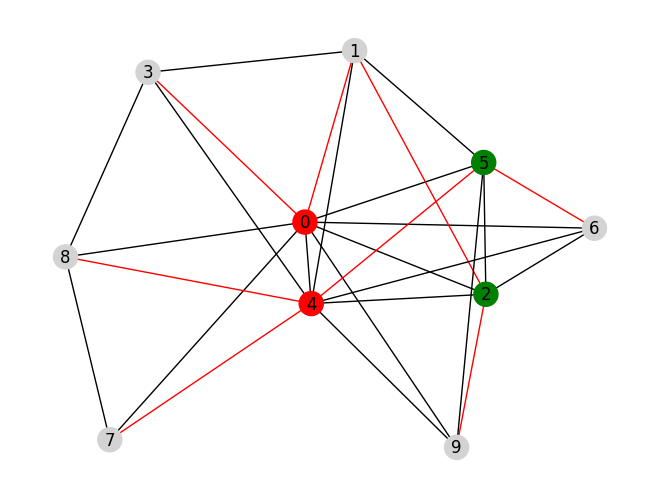

Cluster 0 has color red
Cluster 1 has color green


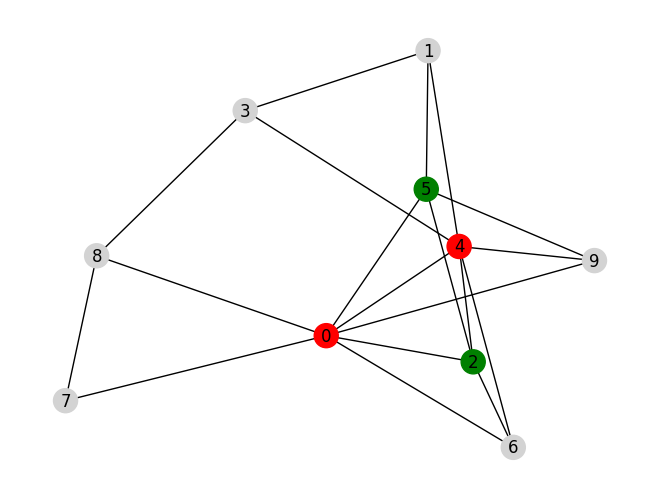

{0: 'red', 1: 'green'}

In [ ]:
def drop_edges(G: Data, disc_e: torch.Tensor) -> Data:
    keep = disc_e > 0 # [E] booleans
    src, dst = G.edge_index

    # G.edge_index [2, E]
    kept_idx = keep.nonzero().view(-1)
    for idx in kept_idx: # for any edge that is kept keep reversal
        rev_mask = (src == dst[idx]) & (dst == src[idx])
        keep[rev_mask] = True

    # slice edge_index & edge_attr
    edge_index_ref = G.edge_index[:, keep]  # (2 , E_keep)
    edge_attr_ref  = G.edge_attr[keep] # (E_keep,)

    G_refined = Data(
        x          = G.x,
        edge_index = edge_index_ref,
        edge_attr  = edge_attr_ref,
        y          = G.y
    )

    return G_refined

# test using old graph
visualize_clusters(test_refinedGraphData, test_partitioning)
test_edges_removed_graph = drop_edges(test_refinedGraphData, test_refinedGraphData.edge_attr) # first refine graph Gltilde
visualize_clusters(test_edges_removed_graph, test_partitioning)

Building P matrix from discretized v to expand graph. We have GLm1tilde right now, to expand it we can reuse PLm1 (proj matrix used to create GLm1) but we need to create it using sampled vLm1.

In [ ]:
def build_Pl_from_vl(v_bin: torch.Tensor) -> torch.Tensor:
    """
    build Pl from vl where Pl is used to obtain Gl from Glm1, and vl is the expansion counts of Gl nodes to obtain Glm1

    v_bin discretized version (N,) (-1 keep, +1 duplicate)
    returns P [N, Ne] where Ne is the number of nodes after expansion
    P is the cluster-node mapping, nodes are created in expanded graph and mapped to cluster nodes from current graph
    cluster nodes are represented by v_bin

    each row sums to 1 or 2 (solo cluster / cluster that needs expansion to two nodes)
    each column has exactly one 1 in some cluster row, for each new node in expanded graph (Glm1)
    """

    N = v_bin.numel()
    copies_per_node = (v_bin > 0).long() + 1 # {-1,+1} → {1,2} (N,)
    Ne = copies_per_node.sum().item() # total #nodes after expand

    P = torch.zeros((N, Ne), dtype=torch.float32)

    col = 0                                            # current fine-node id
    for cluster_id, n_copies in enumerate(copies_per_node.tolist()): # for each cluster node i=0...N-1
        for _ in range(n_copies): # 1× or 2×
            P[cluster_id, col] = 1.0 # add 1 to represent node in cluster
            col += 1 # next free column

    return P

# test
test_PLm1 = build_Pl_from_vl(test_disc_v_Lm1)
print(test_PLm1) # PLm1 is used to coarsen GLm2 into GLm1

tensor([[1., 1., 0.],
        [0., 0., 1.]])


Expand graph and fill with new embeddings

In [ ]:
test_GLm2_adj = expand_coarsened(test_edges_removed_graph, test_PLm1) # then expand graph GLm1 into GLm2 using PLm2

# convert to graph Data object
edge_index, edge_attr = dense_to_sparse(test_GLm2_adj)
x = torch.zeros((test_GLm2_adj.size(0), 1), dtype=torch.float)
test_GLm2 = Data(x=x, edge_index=edge_index, edge_attr=edge_attr) # edge_attr and .y do not matter since they are predicted
# however it is missing embeddings for next model prediction...

GLm2 = fill_H_embeddings(test_GLm2, test_GLm1, test_PLm1, embedding_model) # this function is given some Gl, and its vl
# and it returns embeddings for Glm1 in the paper, here we use Plm1 instead of vl and input GLm1 to calculate
# GLm2's embeddings...

print(GLm2.num_nodes)

3


## Implementing algo 7

In [ ]:
def denoise_one_step(G_t: Data, t: int, model, scheduler, init_N: int, pho_l: float, device: torch.device):
    """
    Computes a single reverse DDPM step on v_l and e_l.
    Returns the denoised G_t graph.
    """

    # use same timestep for all nodes/edges
    t_node = torch.full((G_t.x.size(0),), t, dtype=torch.long, device=device) # [num_nodes] contains repeated t value
    t_edge = torch.full((G_t.edge_attr.size(0),), t, dtype=torch.long, device=device) # [num_edges] contains repeated t value

    init_N_tensor = torch.tensor([init_N], dtype=torch.long, device=device) # target size of G0
    pho_tensor    = torch.tensor([pho_l],  dtype=torch.long, device=device) # sampled reduction frac

    batch = Batch.from_data_list([G_t]).to(device) # wrap graph in batch

    eps_v, eps_e = model(batch, t_node, t_edge, init_N_tensor, pho_tensor) # predicted noise for one step

    v_in   = G_t.y.unsqueeze(-1) # (num_nodes,1)
    step_v = scheduler.step(eps_v.unsqueeze(-1), t, v_in) # noise v
    v_tm1  = step_v.prev_sample.squeeze(-1) # (num_nodes,) applies denoising

    e_in   = G_t.edge_attr.unsqueeze(-1) # (num_edges,1)
    step_e = scheduler.step(eps_e.unsqueeze(-1),
                            t, e_in)
    e_tm1  = step_e.prev_sample.squeeze(-1) # (num_edges,) applies denoising

    G_tm1 = Data(x = G_t.x, edge_index = G_t.edge_index, edge_attr  = e_tm1, y = v_tm1)

    return G_tm1

In [ ]:
def draw_current_graph(fig, ax, G_l):
    ax.clear()
    nx.draw(
        to_networkx(G_l),
        ax=ax,
        with_labels=True,
        node_size=50,
        font_size=8,
        alpha=0.8,
        **{"pos": nx.spring_layout(to_networkx(G_l), seed=42)}  # fixed layout for smooth animation
    )

    fig.canvas.draw()   # re‐draw the canvas
    plt.pause(0.1)      # brief pause to allow the GUI event loop to run

In [ ]:
def sample_graph(init_N: int, model, scheduler, min_red: float = 0.10, max_red: float = 0.30, feat_dim: int = 128, debug = False) -> Data:
    if debug: fig, ax = plt.subplots(figsize=(6,6)) # create a figure & axes once
    """
    Generates a graph with ≈ init_N nodes using the trained denoiser.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = model.to(device).eval()
    T = scheduler.config.num_train_timesteps

    G_l = seed_graph(feat_dim) #GLm1 with two vertices, one edge

    # ----------------------------------------------------------------------
    # loop over levels  l = L-1 , … , 1 (stop when #V >= init_N)
    # ----------------------------------------------------------------------
    while G_l.num_nodes < init_N:
        if debug: draw_current_graph(fig, ax, G_l)

        pho_l = float(torch.empty(1).uniform_(min_red, max_red)) # sample between min_red and max_red
        # represents reduction % of previous coarsening step

        # calculate future duplication count to match pho_l
        Nc = G_l.num_nodes
        Ne = Nc / (1 - pho_l)

        n_dup = (Ne-Nc) # since each expansion adds 1 to node count, converts tensor
        n_dup = int(max(math.floor(Ne - Nc), 1)) # at least one duplication
        n_dup = min(n_dup, init_N-Nc) # we want init_N size at the end

        print(f"Adding {n_dup} nodes...")

        G_t = G_l.clone()
        G_t.y = torch.randn(G_l.num_nodes, device=device)
        G_t.edge_attr = torch.randn(G_l.edge_attr.size(0), device=device)

        for t in trange(T-1, -1, -1, leave=False): # reverse diffusion process
            G_t = denoise_one_step(G_t, t, model, scheduler, init_N, pho_l, device)

        v_bin, e_bin = discretise(G_t.y, G_t.edge_attr, n_dup) # discretize and make sure to only keep n_dup

        G_ref = drop_edges(G_l, e_bin).to(device) # drop selected edges

        # expand graph
        P_l = build_Pl_from_vl(v_bin).to(device) # [Nc,Ne] cluster-node mapping
        adj = expand_coarsened(G_ref, P_l).to(device)
        ei, _ = dense_to_sparse(adj)

        G_fine = Data(x=torch.zeros((adj.size(0), feat_dim), device=device), edge_index=ei,
                      edge_attr=torch.ones(ei.size(1), device=device), y = torch.ones(adj.size(0), device=device)*-1)

        # G_fine is expanded version of G_ref
        G_fine = fill_H_embeddings(G_fine, G_ref, P_l, embedding_model) # fill new embeddings from coarsened graph

        G_l = G_fine
        if debug: print(G_l.num_nodes)
        if debug: nx.draw(to_networkx(G_l), with_labels=True)

    if debug: plt.show()
    return G_l.to("cpu")

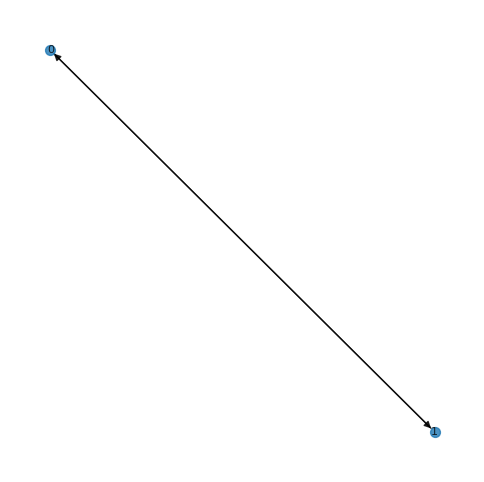

Adding 1 nodes...


  0%|          | 0/1000 [00:00<?, ?it/s]

3


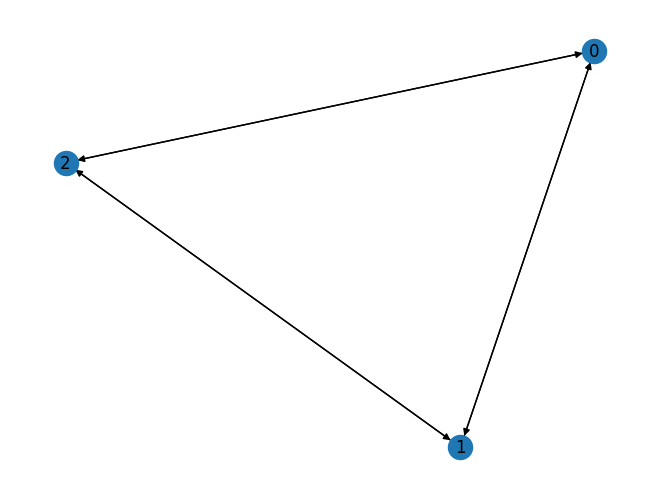

Adding 1 nodes...


  0%|          | 0/1000 [00:00<?, ?it/s]

4


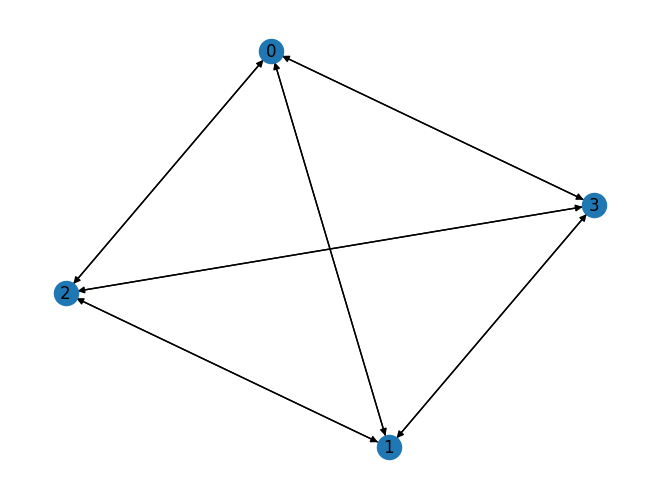

Adding 1 nodes...


  0%|          | 0/1000 [00:00<?, ?it/s]

5


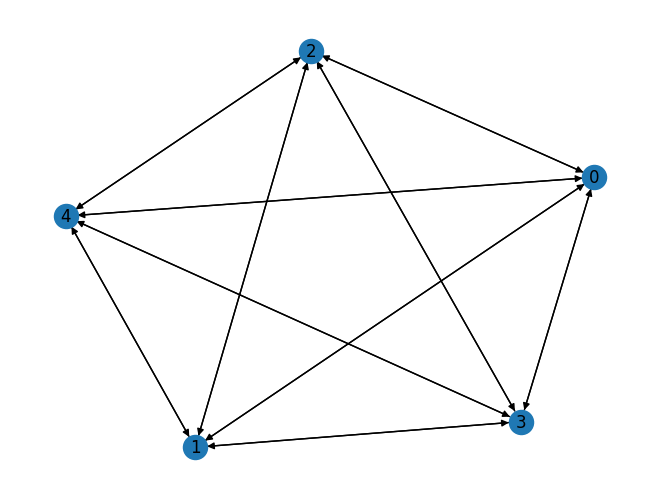

Adding 1 nodes...


  0%|          | 0/1000 [00:00<?, ?it/s]

6


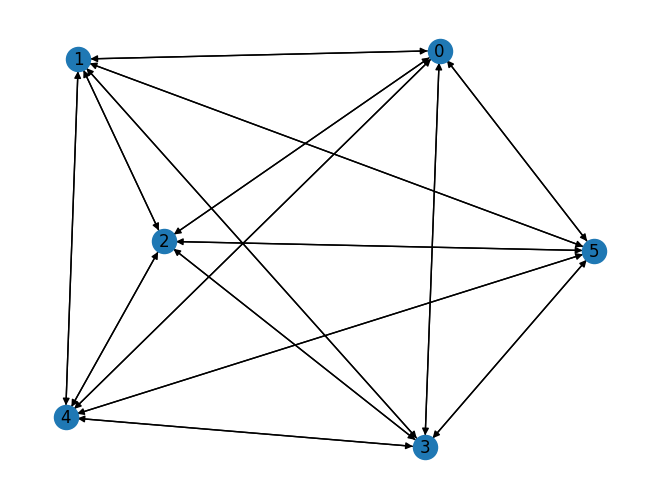

Adding 2 nodes...


  0%|          | 0/1000 [00:00<?, ?it/s]

8


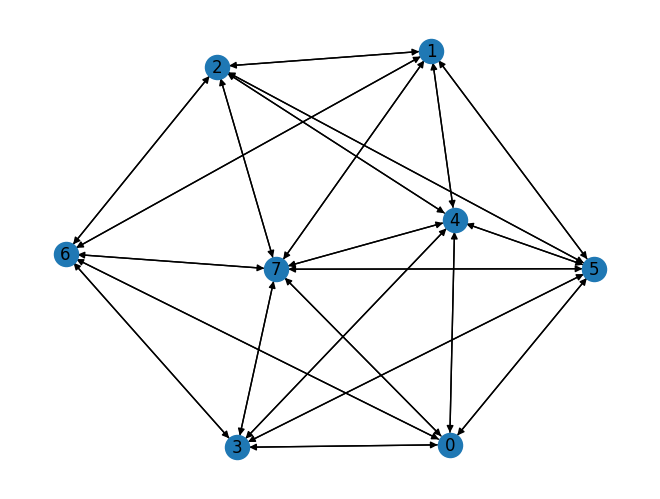

Adding 2 nodes...


  0%|          | 0/1000 [00:00<?, ?it/s]

10


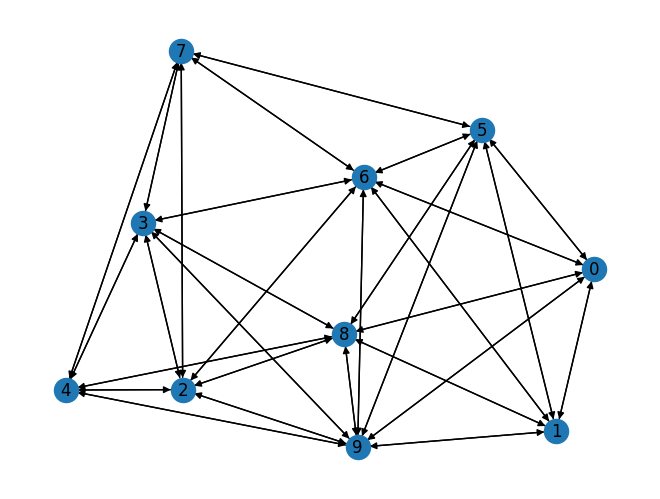

Adding 1 nodes...


  0%|          | 0/1000 [00:00<?, ?it/s]

12


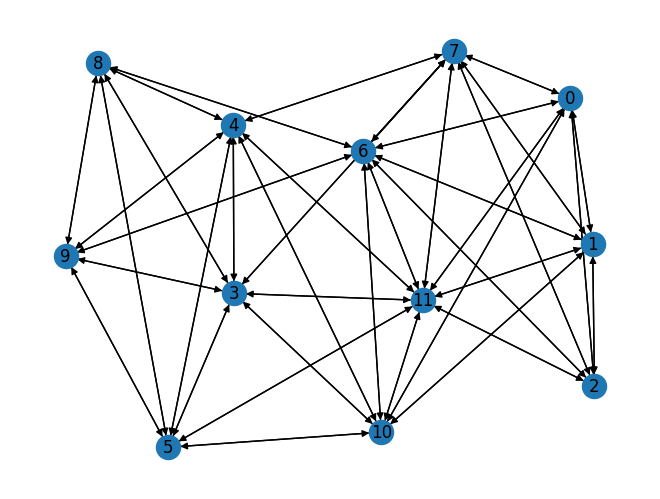

In [ ]:
sample_G = sample_graph(12, model, scheduler, debug = True)

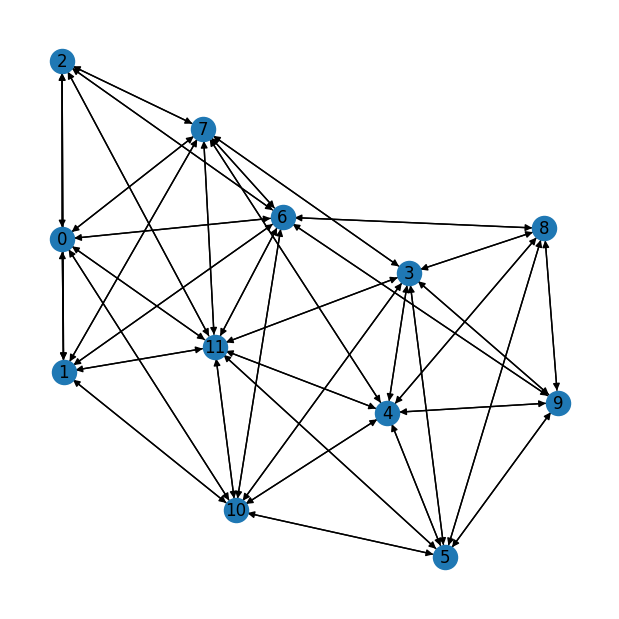

In [ ]:
plt.figure(figsize=(6,6))
nx.draw(to_networkx(sample_G), with_labels=True)
plt.show()

# Generate dataset

In [ ]:
save_dir = "/content/drive/My Drive/sampled_erdos_renyi"
os.makedirs(save_dir, exist_ok=True)

# Suppress print statements
@contextlib.contextmanager
def suppress_output():
    with open(os.devnull, 'w') as devnull:
        old_stdout = sys.stdout
        sys.stdout = devnull
        try:
            yield
        finally:
            sys.stdout = old_stdout

for i in tqdm(range(50), desc="Generating graphs"):
    with suppress_output():
        sample_G = to_networkx(sample_graph(10, model, scheduler))
    path = f"{save_dir}/graph_{i}.graphml"
    nx.write_graphml(sample_G, path)

Generating graphs:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:   2%|▏         | 1/50 [01:04<52:19, 64.07s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:   4%|▍         | 2/50 [01:58<46:42, 58.38s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:   6%|▌         | 3/50 [02:54<44:49, 57.22s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:   8%|▊         | 4/50 [03:49<43:14, 56.39s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  10%|█         | 5/50 [04:36<39:45, 53.00s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  12%|█▏        | 6/50 [05:32<39:35, 53.99s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  14%|█▍        | 7/50 [06:19<37:07, 51.80s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  16%|█▌        | 8/50 [07:01<34:04, 48.67s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  18%|█▊        | 9/50 [07:57<34:47, 50.92s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  20%|██        | 10/50 [08:44<33:11, 49.79s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  22%|██▏       | 11/50 [09:48<35:04, 53.96s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  24%|██▍       | 12/50 [10:43<34:25, 54.35s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  26%|██▌       | 13/50 [11:39<33:51, 54.90s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  28%|██▊       | 14/50 [12:34<32:58, 54.95s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  30%|███       | 15/50 [13:30<32:18, 55.37s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  32%|███▏      | 16/50 [14:18<30:05, 53.12s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  34%|███▍      | 17/50 [15:14<29:37, 53.87s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  36%|███▌      | 18/50 [16:10<29:04, 54.53s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  38%|███▊      | 19/50 [17:06<28:22, 54.92s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  40%|████      | 20/50 [18:02<27:42, 55.42s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  42%|████▏     | 21/50 [18:58<26:48, 55.48s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  44%|████▍     | 22/50 [20:03<27:12, 58.32s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  46%|████▌     | 23/50 [20:59<25:56, 57.66s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  48%|████▊     | 24/50 [21:56<24:49, 57.28s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  50%|█████     | 25/50 [22:52<23:44, 56.98s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  52%|█████▏    | 26/50 [23:40<21:46, 54.43s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  54%|█████▍    | 27/50 [24:45<22:02, 57.51s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  56%|█████▌    | 28/50 [25:42<21:01, 57.35s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  58%|█████▊    | 29/50 [26:39<20:03, 57.30s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  60%|██████    | 30/50 [27:35<18:58, 56.92s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  62%|██████▏   | 31/50 [28:32<18:03, 57.00s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  64%|██████▍   | 32/50 [29:21<16:21, 54.53s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  66%|██████▌   | 33/50 [30:18<15:38, 55.20s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  68%|██████▊   | 34/50 [31:15<14:51, 55.73s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  70%|███████   | 35/50 [32:20<14:37, 58.48s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  72%|███████▏  | 36/50 [33:17<13:33, 58.08s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  74%|███████▍  | 37/50 [34:13<12:28, 57.55s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  76%|███████▌  | 38/50 [35:10<11:28, 57.42s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  78%|███████▊  | 39/50 [35:59<10:01, 54.70s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  80%|████████  | 40/50 [37:03<09:36, 57.67s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  82%|████████▏ | 41/50 [38:01<08:37, 57.55s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  84%|████████▍ | 42/50 [38:57<07:38, 57.35s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  86%|████████▌ | 43/50 [39:47<06:24, 54.94s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  88%|████████▊ | 44/50 [40:36<05:18, 53.09s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  90%|█████████ | 45/50 [41:24<04:18, 51.73s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  92%|█████████▏| 46/50 [42:22<03:33, 53.44s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  94%|█████████▍| 47/50 [43:19<02:43, 54.65s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  96%|█████████▌| 48/50 [44:17<01:51, 55.53s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  98%|█████████▊| 49/50 [45:14<00:56, 56.19s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs: 100%|██████████| 50/50 [46:11<00:00, 55.44s/it]


In [ ]:
save_dir = "/content/drive/My Drive/sampled_planar"
os.makedirs(save_dir, exist_ok=True)

# Suppress print statements
@contextlib.contextmanager
def suppress_output():
    with open(os.devnull, 'w') as devnull:
        old_stdout = sys.stdout
        sys.stdout = devnull
        try:
            yield
        finally:
            sys.stdout = old_stdout

for i in tqdm(range(50), desc="Generating graphs"):
    with suppress_output():
        sample_G = to_networkx(sample_graph(12, model, scheduler))
    path = f"{save_dir}/graph_{i}.graphml"
    nx.write_graphml(sample_G, path)

Generating graphs:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:   2%|▏         | 1/50 [00:57<47:01, 57.57s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:   4%|▍         | 2/50 [02:04<50:28, 63.09s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:   6%|▌         | 3/50 [03:19<53:36, 68.43s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:   8%|▊         | 4/50 [04:18<49:44, 64.88s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  10%|█         | 5/50 [05:25<49:03, 65.41s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  12%|█▏        | 6/50 [06:23<46:14, 63.07s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  14%|█▍        | 7/50 [07:39<48:11, 67.24s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  16%|█▌        | 8/50 [08:38<45:09, 64.50s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  18%|█▊        | 9/50 [09:44<44:28, 65.08s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  20%|██        | 10/50 [10:43<42:10, 63.26s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  22%|██▏       | 11/50 [11:33<38:32, 59.30s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  24%|██▍       | 12/50 [12:32<37:20, 58.97s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  26%|██▌       | 13/50 [13:40<38:06, 61.80s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  28%|██▊       | 14/50 [14:56<39:43, 66.22s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  30%|███       | 15/50 [16:13<40:25, 69.30s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  32%|███▏      | 16/50 [17:29<40:27, 71.41s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  34%|███▍      | 17/50 [18:31<37:40, 68.50s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  36%|███▌      | 18/50 [19:40<36:41, 68.81s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  38%|███▊      | 19/50 [20:57<36:46, 71.18s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  40%|████      | 20/50 [22:05<35:05, 70.17s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  42%|████▏     | 21/50 [23:13<33:36, 69.55s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  44%|████▍     | 22/50 [24:21<32:11, 68.99s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  46%|████▌     | 23/50 [25:20<29:48, 66.22s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  48%|████▊     | 24/50 [26:28<28:54, 66.72s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  50%|█████     | 25/50 [27:37<28:00, 67.20s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  52%|█████▏    | 26/50 [28:37<26:00, 65.02s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  54%|█████▍    | 27/50 [29:53<26:11, 68.35s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  56%|█████▌    | 28/50 [31:02<25:08, 68.57s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  58%|█████▊    | 29/50 [32:09<23:52, 68.20s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  60%|██████    | 30/50 [33:26<23:33, 70.65s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  62%|██████▏   | 31/50 [34:26<21:24, 67.59s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  64%|██████▍   | 32/50 [35:35<20:23, 67.97s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  66%|██████▌   | 33/50 [36:44<19:23, 68.42s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  68%|██████▊   | 34/50 [37:53<18:16, 68.55s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  70%|███████   | 35/50 [39:02<17:07, 68.51s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  72%|███████▏  | 36/50 [40:11<16:03, 68.83s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  74%|███████▍  | 37/50 [41:12<14:23, 66.45s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  76%|███████▌  | 38/50 [42:21<13:26, 67.25s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  78%|███████▊  | 39/50 [43:31<12:28, 68.07s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  80%|████████  | 40/50 [44:31<10:56, 65.61s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  82%|████████▏ | 41/50 [45:41<10:01, 66.85s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  84%|████████▍ | 42/50 [46:42<08:40, 65.04s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  86%|████████▌ | 43/50 [47:43<07:26, 63.83s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  88%|████████▊ | 44/50 [48:43<06:16, 62.83s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  90%|█████████ | 45/50 [50:00<05:35, 67.12s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  92%|█████████▏| 46/50 [51:09<04:30, 67.71s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  94%|█████████▍| 47/50 [52:20<03:25, 68.54s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  96%|█████████▌| 48/50 [53:30<02:18, 69.14s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs:  98%|█████████▊| 49/50 [54:31<01:06, 66.76s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Generating graphs: 100%|██████████| 50/50 [55:41<00:00, 66.84s/it]


# Fetch dataset and compute metrics

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Folder containing GraphML files
graph_dir = "/content/drive/My Drive/sampled_erdos_renyi"

# Output CSV file path
csv_path = "/content/drive/My Drive/erdos_renyi_features.csv"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Initialize list to collect data
data = []

# Recursively search for .graphml files
graph_files = []
for root, dirs, files in os.walk(graph_dir):
    for file in files:
        if file.endswith(".graphml"):
            graph_files.append(os.path.join(root, file))

# Process each graph
for path in tqdm(graph_files, desc="Processing graphs"):
    G = nx.read_graphml(path)

    # Ensure graph is undirected
    if G.is_directed():
        G = G.to_undirected()

    # Compute all-pairs shortest paths
    # for each node return dict target_node: shortest path value

    lengths = dict(nx.all_pairs_shortest_path_length(G))

    # Compute clustering coefficients
    clustering = nx.clustering(G)

    for node in G.nodes():
        node_id = node
        neighbors = len(list(G.neighbors(node)))

        # Average shortest path length from this node
        sp_lengths = lengths[node]
        avg_sp = sum(sp_lengths.values()) / (len(G) - 1)

        clustering_coeff = clustering[node]

        data.append({
            "graph_name": os.path.basename(path),
            "node_id": node_id,
            "degree": neighbors,
            "avg_shortest_path_length": avg_sp,
            "clustering_coeff": clustering_coeff
        })

# Save to CSV in write-only mode
with open(csv_path, 'w') as f:
    df = pd.DataFrame(data)
    df.to_csv(f, index=False)

print(f"Saved node features to: {csv_path}")

Processing graphs: 100%|██████████| 50/50 [00:00<00:00, 924.03it/s]

Saved node features to: /content/drive/My Drive/erdos_renyi_features.csv


Plot metrics.

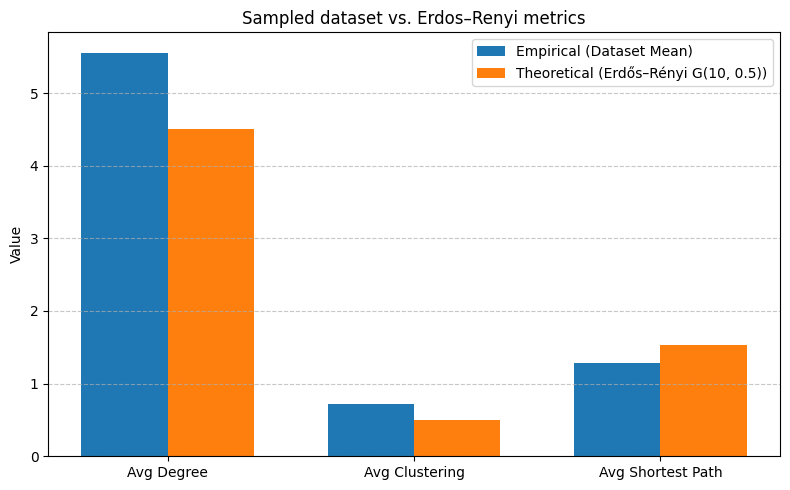

In [ ]:
# Read the saved CSV
df = pd.read_csv(csv_path)

# Group by graph, then compute mean per graph
graph_means = df.groupby("graph_name").agg({
    "degree": "mean",
    "clustering_coeff": "mean",
    "avg_shortest_path_length": "mean"
})

# Compute dataset-wide mean of each feature
empirical_means = graph_means.mean()

# Erdos–Renyi G(n, p) theoretical values
n = 10
p = 0.5
theoretical_values = {
    "degree": (n - 1) * p,
    "clustering_coeff": p,
    "avg_shortest_path_length": np.log(n) / np.log((n - 1) * p)  # approximation
}

# Prepare data for plotting
features = ["degree", "clustering_coeff", "avg_shortest_path_length"]
empirical = [empirical_means[f] for f in features]
theoretical = [theoretical_values[f] for f in features]

# Plot comparison
x = np.arange(len(features))
width = 0.35

plt.figure(figsize=(8, 5))
plt.bar(x - width/2, empirical, width, label="Empirical (Dataset Mean)")
plt.bar(x + width/2, theoretical, width, label="Theoretical (Erdős–Rényi G(10, 0.5))")

plt.xticks(x, ["Avg Degree", "Avg Clustering", "Avg Shortest Path"])
plt.ylabel("Value")
plt.title("Sampled dataset vs. Erdos–Renyi metrics")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

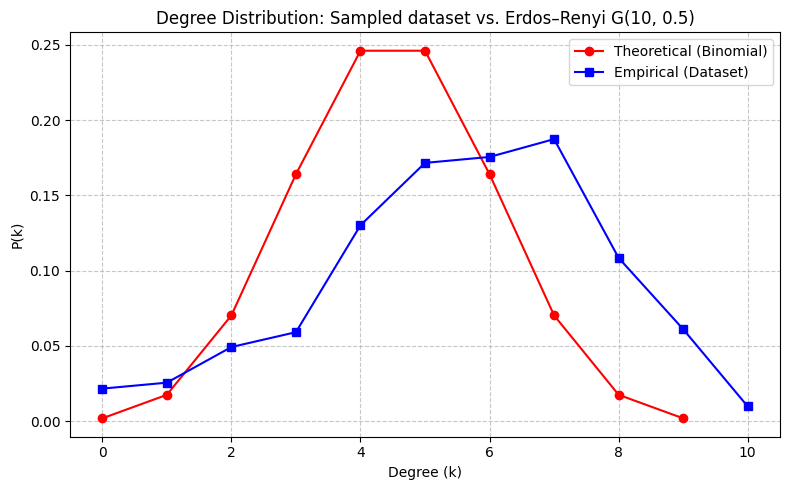

In [ ]:
# Extract all degrees from the dataset
all_degrees = df["degree"].values
max_degree = int(max(all_degrees))

# Compute empirical degree probabilities
empirical_counts = np.bincount(all_degrees, minlength=max_degree+1)
empirical_probs = empirical_counts / empirical_counts.sum()

# Theoretical degree probabilities (Erdős–Rényi Binomial)
n = 10
p = 0.5
k_values = np.arange(0, n)  # degrees from 0 to n-1
theoretical_probs = binom.pmf(k_values, n - 1, p)

# Plot
plt.figure(figsize=(8, 5))
plt.plot(k_values, theoretical_probs, 'o-', label="Theoretical (Binomial)", color='red')
plt.plot(np.arange(len(empirical_probs)), empirical_probs, 's-', label="Empirical (Dataset)", color='blue')

plt.xlabel("Degree (k)")
plt.ylabel("P(k)")
plt.title("Degree Distribution: Sampled dataset vs. Erdos–Renyi G(10, 0.5)")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

Planar graphs metrics

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Folder containing GraphML files
graph_dir = "/content/drive/My Drive/sampled_planar"

# Output CSV file path
csv_path = "/content/drive/My Drive/planar.csv"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
files = [f for f in os.listdir(graph_dir) if f.endswith('.graphml')]
num_graphs = len(files)

# Initialize counters
count_planar = 0
total_density = 0.0

# Process each graph
for fname in files:
    path = os.path.join(graph_dir, fname)
    G = nx.read_graphml(path)
    if G.is_directed():
        G = G.to_undirected()

    # Metric 1: planarity flag
    planar, _ = nx.check_planarity(G)
    count_planar += int(planar)

    # Metric 2: graph density
    total_density += nx.density(G)

# Compute and display metrics
prop_planar = count_planar / num_graphs
avg_density = total_density / num_graphs

print(f"Total graphs: {num_graphs}")
print(f"Proportion planar: {prop_planar:.1%}")
print(f"Average density: {avg_density:.3f}")

Total graphs: 50
Proportion planar: 10.0%
Average density: 0.410
